In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import numpy as np

In [3]:
########## SQ strategy

In [4]:
#SQ = pd.read_csv(r'../../results/computed-fuel-rates-oct2021-sep2022.csv', low_memory=False)
SQ = pd.read_csv(r'../../results/computed-fuel-rates-oct2021-sep2022-12212023.csv', low_memory=False)

In [5]:
#SQ.columns

In [6]:
SQ_copy=SQ.copy()
SQ_copy['diesel'] = SQ_copy['Energy'].apply(lambda x: x if x != 'electric' else 0)
SQ_copy['CO2'] = SQ_copy['diesel']*0.01086879 ### For each gallon of diesel burned, 9.86 kgCO$_2$e of greenhouse gas (GHG) emissions are produced.
### 9.86kg = 0.01086879 us tons
# Group by 'Route' and sum
grouped = SQ_copy.groupby('Route').agg({'CO2': 'sum', 'diesel': 'sum', 'dist': 'sum'}).reset_index()
# Calculate per mile columns
grouped['CO2_per_mile'] = grouped['CO2'] / grouped['dist']
grouped['diesel_per_mile'] = grouped['diesel'] / grouped['dist']
grouped

,Route,CO2,diesel,dist,CO2_per_mile,diesel_per_mile
0,(X) 34,14.559852,1339.601894,3493.935877,0.004167,0.383408
1,(X) 38,48.316452,4445.430601,12031.694755,0.004016,0.369477
2,(X) 39E,11.689772,1075.535711,4020.914645,0.002907,0.267485
3,(X) 801,2.448504,225.278457,457.136333,0.005356,0.492804
4,(X) 802,3.115258,286.624164,672.684756,0.004631,0.426090
...,...,...,...,...,...,...
65,R41,202.456623,18627.337828,58438.453463,0.003464,0.318751
66,R42,174.855529,16087.856088,65889.851650,0.002654,0.244163
67,R44,204.666296,18830.642208,50927.972035,0.004019,0.369750
68,X90,576.236800,53017.566785,143406.064045,0.004018,0.369702


In [7]:
# Replace leading '(X)' and any leading whitespace
grouped['Route'] = grouped['Route'].str.replace(r'^\(X\)\s*', '', regex=True)
grouped['Route'].unique()

array(['34', '38', '39E', '801', '802', '803', '804', '805', '806', '820',
       '821', '823', '824', '892', '902', '943', 'B9', 'P11', '30', '31',
       '33', '35', '36', '45', '46', '890', '921', '9999', 'B12', 'B17',
       'B23', 'B4', 'B43', 'B48', 'B6', 'B7', 'B79', 'G1', 'G2', 'G3',
       'G5', 'G73', 'P20', 'P21', 'R10', 'R14', 'R24', 'R29', 'R41',
       'R42', 'R44', 'X90', 'X92'], dtype=object)

In [8]:
#grouped.to_csv(r'../../results/Status quo-diesel-whole-year.csv', index=False)

In [9]:
#grouped_trips

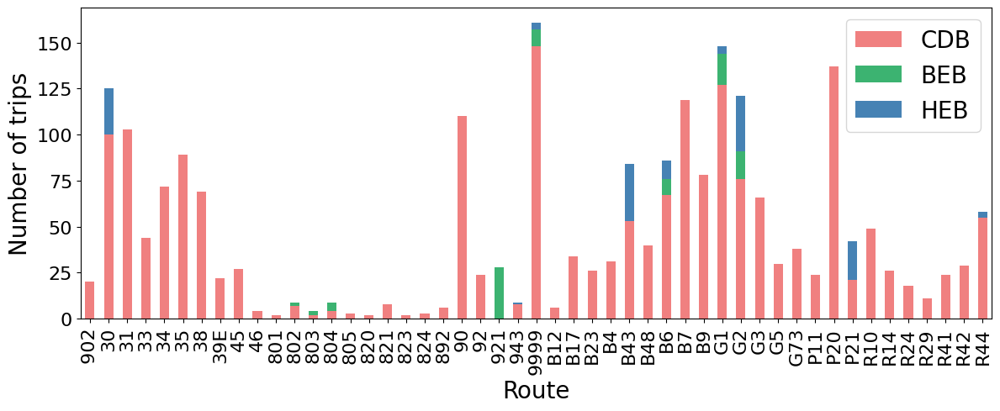

In [10]:
# Filter the dataframe for date 2021-10-29
SQ_filtered = SQ.loc[SQ['Date']=='2021-10-29'].copy()

# Remove X and (X) from routes names
SQ_filtered['Route'] = SQ_filtered['Route'].str.replace(r'\(X\)', '', regex=True) # replace (X)
SQ_filtered['Route'] = SQ_filtered['Route'].str.replace('X', '', regex=False) # replace X

# Group by Route and Powertrain to count unique trips
grouped_trips = SQ_filtered.groupby(['Route', 'Powertrain'])['Trip'].nunique().unstack(fill_value=0)

# Rename columns
grouped_trips = grouped_trips.rename(columns={
    'conventional': 'CDB',
    'hybrid': 'HEB',
    'electric': 'BEB'
})


# Plot
# Create a figure and a set of subplots with larger size
fig, ax = plt.subplots(figsize=(12, 5))

colors = {'CDB': 'lightcoral', 'HEB': 'steelblue', 'BEB': 'mediumseagreen'}
ax = grouped_trips.plot(kind='bar', stacked=True, color=[colors[col] for col in grouped_trips.columns], ax=ax)

# Annotate with BEB percentages
for index, (route, row) in enumerate(grouped_trips.iterrows()):
    total = row.sum()
    BEB_count = row.get('BEB', 0)
    percentage = (BEB_count / total) * 100
    
# Set the title and labels with larger font sizes
ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Number of trips', fontsize=20)
ax.legend(fontsize=20)
#ax.set_xlabel('')
#ax.set_xticks([])
# Increase the font size for tick labels
ax.tick_params(axis='both', labelsize=16)

plt.tight_layout()

fig.savefig(r'../../figures/SQ_route_electrification.png', dpi=400)  

plt.show()


In [11]:
# Compute the total BEB counts and total trips
total_BEB_counts = grouped_trips['BEB'].sum()
total_trips = grouped_trips.sum(axis=1).sum()

# Calculate average %BEB across all routes
average_percentage_BEB = (total_BEB_counts / total_trips) * 100

print(f"Average %BEB across all routes: {average_percentage_BEB:.2f}%")


Average %BEB across all routes: 3.82%


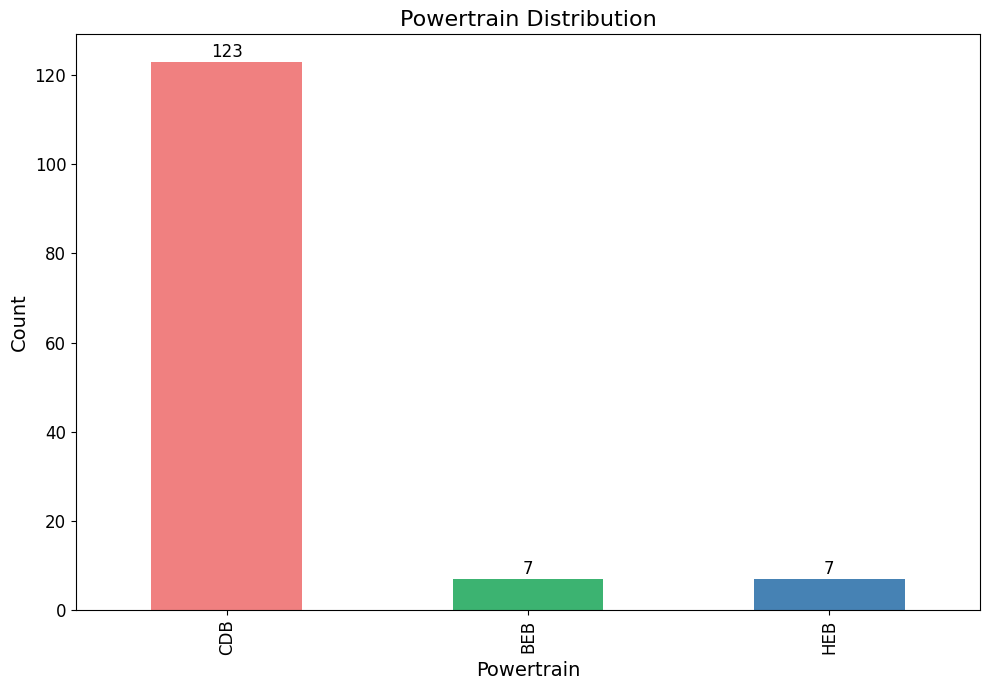

In [12]:
# Drop duplicate Vehicles while retaining the associated Powertrain
unique_vehicles = SQ_filtered.drop_duplicates(subset='Vehicle', keep='first')

# Count occurrences of each Powertrain
powertrain_counts = unique_vehicles['Powertrain'].value_counts()

# Define colors
colors = {'conventional': 'lightcoral', 'hybrid': 'steelblue', 'electric': 'mediumseagreen'}

# Create a larger plot with increased font size
plt.figure(figsize=(10,7))
ax = powertrain_counts.plot(kind='bar', color=[colors[p] for p in powertrain_counts.index])

# Annotate bars with their count
for i, v in enumerate(powertrain_counts):
    ax.text(i, v + 0.1, str(v), ha='center', va='bottom', fontsize=12)

# Labels, title, and formatting
plt.xlabel('Powertrain', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Powertrain Distribution', fontsize=16)
labels = {'conventional': 'CDB', 'hybrid': 'HEB', 'electric': 'BEB'}
plt.xticks(range(len(powertrain_counts.index)), [labels[p] for p in powertrain_counts.index], fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()

plt.show()

In [13]:
# Calculate sum for each Year for each DataFrame
#h_FH_variables['Result'] = h_FH_variables['Value'] * h_FH_variables['Coefficient']
#h_FH_sum = h_FH_variables.groupby('Year')['Result'].sum().reset_index()

#m_FH_variables['Result'] = m_FH_variables['Value'] * m_FH_variables['Coefficient']
#m_FH_sum = m_FH_variables.groupby('Year')['Result'].sum().reset_index()

#l_FH_variables['Result'] = l_FH_variables['Value'] * l_FH_variables['Coefficient']
#l_FH_sum = l_FH_variables.groupby('Year')['Result'].sum().reset_index()

# Add Scenario and Strategy columns
#h_FH_sum['Scenario'] = 'h'
#h_FH_sum['Strategy'] = 'FH'

#m_FH_sum['Scenario'] = 'm'
#m_FH_sum['Strategy'] = 'FH'

#l_FH_sum['Scenario'] = 'l'
#l_FH_sum['Strategy'] = 'FH'

# Concatenate the DataFrames
#final_df = pd.concat([h_FH_sum, m_FH_sum, l_FH_sum])

# Rearrange the columns
#final_df = final_df[['Year', 'Result', 'Scenario', 'Strategy']]
#final_df.to_csv(r'../../results/diesel-FH.csv', index=False)

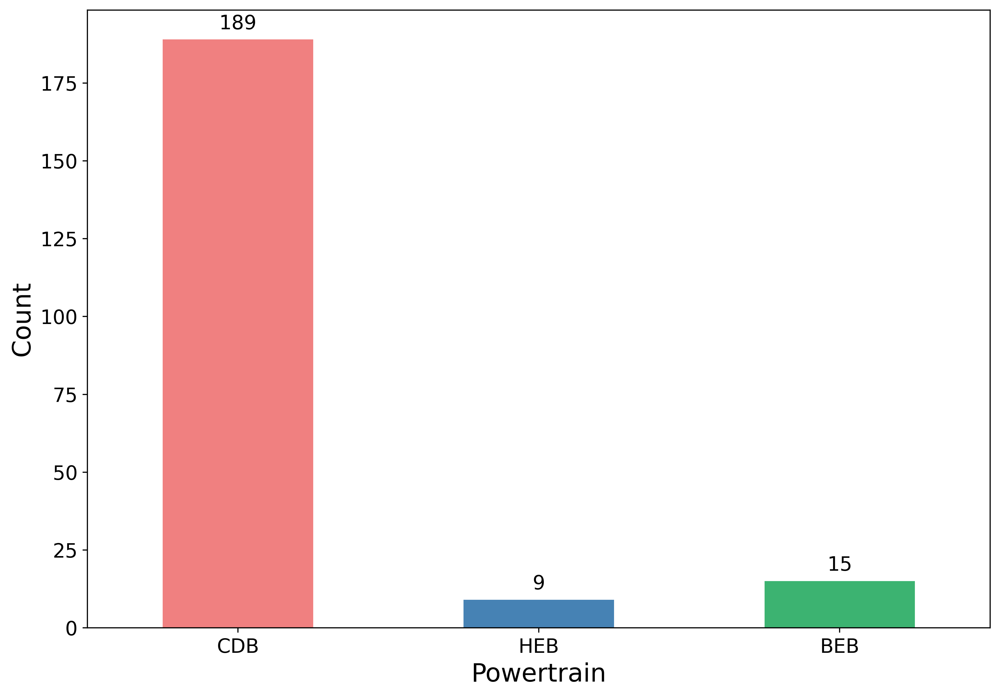

In [14]:
# Define counts and their labels
powertrain_counts = pd.Series({'conventional': 189, 'hybrid': 9, 'electric': 15})

# Define colors
colors = {'conventional': 'lightcoral', 'hybrid': 'steelblue', 'electric': 'mediumseagreen'}

# Create a larger plot with increased font size
plt.figure(figsize=(10,7), dpi=400)
ax = powertrain_counts.plot(kind='bar', color=[colors[p] for p in powertrain_counts.index])

# Annotate bars with their count
for i, v in enumerate(powertrain_counts):
    ax.text(i, v + 2, str(v), ha='center', va='bottom', fontsize=14)  # increased y-value a bit for better placement

# Labels, title, and formatting
plt.xlabel('Powertrain', fontsize=18)
plt.ylabel('Count', fontsize=18)
#plt.title('Powertrain Distribution', fontsize=22)
labels = {'conventional': 'CDB', 'hybrid': 'HEB', 'electric': 'BEB'}
plt.xticks(range(len(powertrain_counts.index)), [labels[p] for p in powertrain_counts.index], fontsize=14, rotation=0)  # set rotation to 0
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig(r'../../figures/fleet.png', dpi=400)  

plt.show()

In [15]:
# Create the 'Result' column in SQ dataframe
SQ['Result'] = SQ['Energy']
SQ.loc[SQ['Powertrain'] == 'electric', 'Result'] = 0
SQ_busiest = SQ.loc[SQ['Date']=='2021-10-29'].copy()


# Create the final_df dataframe
# Start by summing the Result values
total_result = SQ_busiest['Result'].sum()

# Create the dataframe with 'Year' values ranging from 0 to 12
df_SQ = pd.DataFrame({'Year': range(13)})

# Fill the other columns
df_SQ['Result'] = total_result
df_SQ['Scenario'] = 'c'
df_SQ['Strategy'] = 'SQ'

In [16]:
SQ_busiest['Result'].sum()

4177.557119555364

In [17]:
# Group by Route and Powertrain to count unique trips
trips = SQ_filtered.groupby(['Powertrain'])['dist'].sum()

In [18]:
trips

Powertrain
conventional    11385.853110
electric          382.411114
hybrid            772.229864
Name: dist, dtype: float64

In [19]:
11386.146799/(11386.146799+382.512323+772.229864)

0.9079218237009278

In [20]:
382.512323/(11386.146799+382.512323+772.229864)

0.030501212747119994

In [21]:
772.229864/(11386.146799+382.512323+772.229864)

0.06157696355195213

In [22]:
11386.146799+382.512323+772.229864

12540.888986000002

In [23]:
df_SQ_diesel=pd.read_csv(r'../../results/diesel-SQ-calibrated.csv', low_memory=False)

In [24]:
df_BM = pd.read_csv(r'../../results/diesel-BM-with-replacement-40percentBEBcharging.csv', low_memory=False)

In [25]:
df_FE = pd.read_csv(r'../../results/diesel-FE-with-replacement-40percentBEBcharging.csv', low_memory=False)

In [26]:
df_FH = pd.read_csv(r'../../results/diesel-FH-with-replacement.csv', low_memory=False)

In [27]:
#df_PP = pd.read_csv(r'../../results/diesel-PP-with-replacement.csv', low_memory=False)

In [28]:
# List of dataframes to concatenate
dfs = [df_SQ_diesel, df_FH, df_FE, df_BM]

# Concatenate the dataframes
final_df = pd.concat(dfs, ignore_index=True)

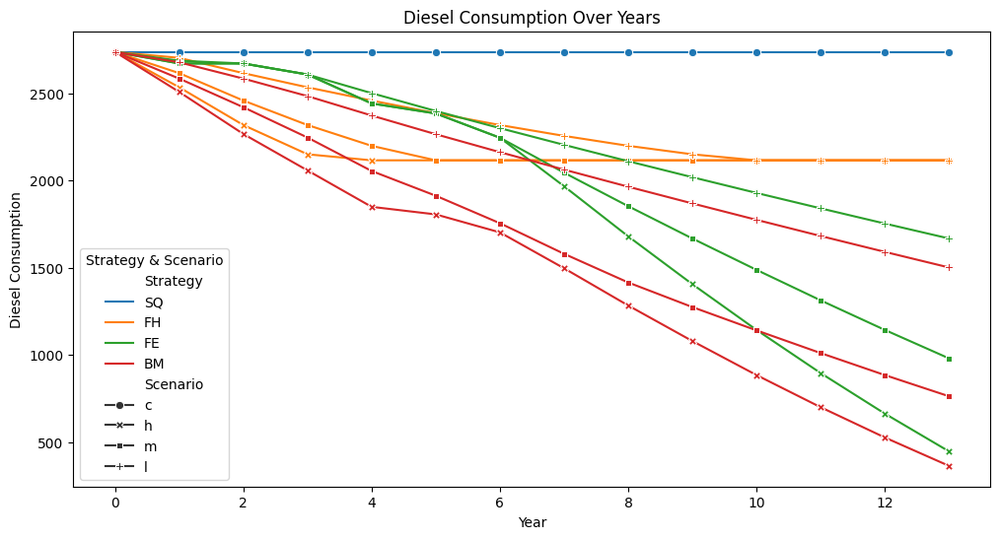

In [29]:
# Ensure that the data types are appropriate for plotting
final_df['Year'] = final_df['Year'].astype(int)
final_df['Result'] = final_df['Result'].astype(float)

# Create the line plot using seaborn
plt.figure(figsize=(12, 6))
sns.lineplot(data=final_df, x='Year', y='Result', hue='Strategy', style='Scenario', markers=True, dashes=False)

# Add titles and labels
plt.title('Diesel Consumption Over Years')
plt.xlabel('Year')
plt.ylabel('Diesel Consumption')
plt.legend(title='Strategy & Scenario')

# Display the plot
plt.show()


In [30]:
import pandas as pd

# Define a mapping dictionary
year_mapping = {i: 2022 + i for i in range(0, 14)}

# Apply the mapping
final_df['Year'] = final_df['Year'].map(year_mapping)

print(final_df)


     Year       Result Scenario Strategy
0    2022  2738.750000        c       SQ
1    2023  2738.750000        c       SQ
2    2024  2738.750000        c       SQ
3    2025  2738.750000        c       SQ
4    2026  2738.750000        c       SQ
..    ...          ...      ...      ...
135  2031  1869.475807        l       BM
136  2032  1775.253148        l       BM
137  2033  1682.534231        l       BM
138  2034  1591.483218        l       BM
139  2035  1501.994164        l       BM

[140 rows x 4 columns]


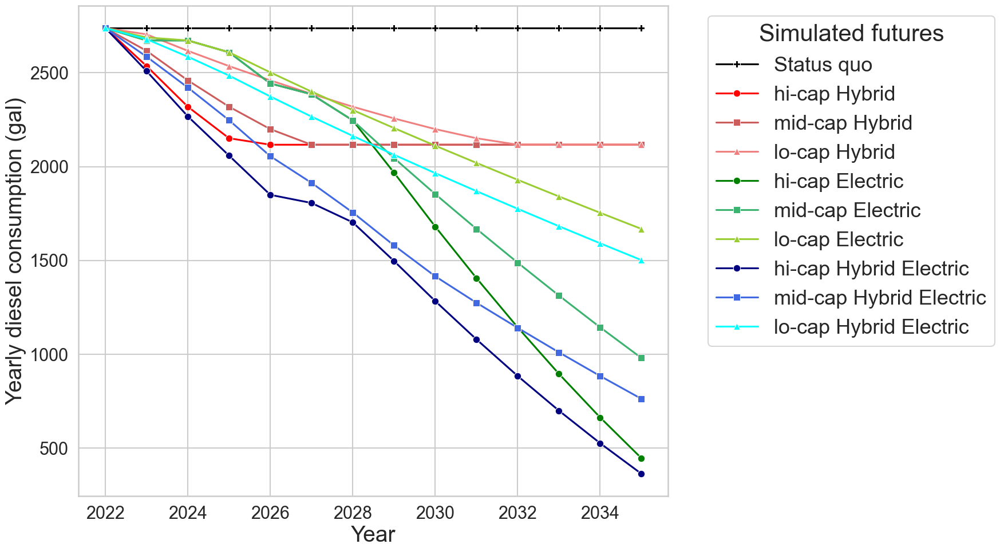

In [31]:
# Mapping combinations to desired names
mapping = {
    ('c', 'SQ'): 'Status quo',
    ('l', 'FH'): 'lo-cap Hybrid',
    ('m', 'FH'): 'mid-cap Hybrid',
    ('h', 'FH'): 'hi-cap Hybrid',
    ('l', 'FE'): 'lo-cap Electric',
    ('m', 'FE'): 'mid-cap Electric',
    ('h', 'FE'): 'hi-cap Electric',
    ('l', 'BM'): 'lo-cap Hybrid Electric',
    ('m', 'BM'): 'mid-cap Hybrid Electric',
    ('h', 'BM'): 'hi-cap Hybrid Electric'
}



final_df['Label'] = final_df.set_index(['Scenario', 'Strategy']).index.map(mapping.get).values
unique_labels = final_df['Label'].unique()

# Improve the plot
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger

# Create a color palette
#palette = sns.color_palette('tab10', n_colors=len(unique_labels))

# Define a custom palette and marker order
custom_palette = {
    "Status quo": "black",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}
custom_markers = {
    "Status quo": "P",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

plt.figure(figsize=(18, 10))

# Use a loop to plot each category with its unique marker and color
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='Result', label=label, dashes=False, 
                 color=custom_palette[label], marker=custom_markers[label])

# Add titles and labels
#plt.title('Diesel Consumption Over Years', fontsize=20)
plt.xlabel('Year', fontsize=28)
plt.ylabel('Yearly diesel consumption (gal)', fontsize=28)
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=26, title_fontsize=30)
#plt.legend(handles=plot.get_lines(), labels=unique_labels, title='Configurations', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/diesel-consumption.png', dpi=400)

# Display the plot
plt.show()


In [32]:
ratios = pd.read_csv(r'../../results/diesel-consumption-distribution-compared-to-busiest-day.csv', low_memory=False)

In [33]:
ratios.columns

Index(['Date', 'UniqueTripsCount', 'Diesel', 'DieselRatio'], dtype='object')

In [34]:
### Scale up the busiest day to a whole year
final_df['YearlyResult'] = final_df['Result'].apply(lambda x: sum(x * ratios['DieselRatio']))
final_df

,Year,Result,Scenario,Strategy,Label,YearlyResult
0,2022,2738.750000,c,SQ,Status quo,707460.738888
1,2023,2738.750000,c,SQ,Status quo,707460.738888
2,2024,2738.750000,c,SQ,Status quo,707460.738888
3,2025,2738.750000,c,SQ,Status quo,707460.738888
4,2026,2738.750000,c,SQ,Status quo,707460.738888
...,...,...,...,...,...,...
135,2031,1869.475807,l,BM,lo-cap Hybrid Electric,482914.006665
136,2032,1775.253148,l,BM,lo-cap Hybrid Electric,458574.862181
137,2033,1682.534231,l,BM,lo-cap Hybrid Electric,434624.157104
138,2034,1591.483218,l,BM,lo-cap Hybrid Electric,411104.296973


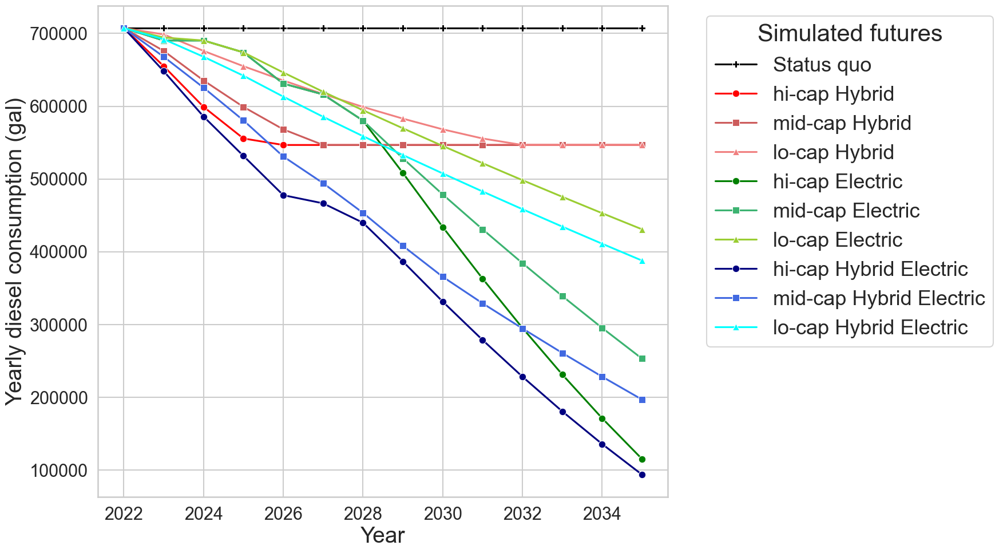

In [35]:
# Mapping combinations to desired names
mapping = {
    ('c', 'SQ'): 'Status quo',
    ('l', 'FH'): 'lo-cap Hybrid',
    ('m', 'FH'): 'mid-cap Hybrid',
    ('h', 'FH'): 'hi-cap Hybrid',
    ('l', 'FE'): 'lo-cap Electric',
    ('m', 'FE'): 'mid-cap Electric',
    ('h', 'FE'): 'hi-cap Electric',
    ('l', 'BM'): 'lo-cap Hybrid Electric',
    ('m', 'BM'): 'mid-cap Hybrid Electric',
    ('h', 'BM'): 'hi-cap Hybrid Electric'
}



#final_df['Year'] = final_df['Year'] + 22

final_df['Label'] = final_df.set_index(['Scenario', 'Strategy']).index.map(mapping.get).values
unique_labels = final_df['Label'].unique()

# Improve the plot
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger

# Create a color palette
#palette = sns.color_palette('tab10', n_colors=len(unique_labels))

# Define a custom palette and marker order
custom_palette = {
    "Status quo": "black",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}
custom_markers = {
    "Status quo": "P",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

plt.figure(figsize=(18, 10))

# Use a loop to plot each category with its unique marker and color
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='YearlyResult', label=label, dashes=False, 
                 color=custom_palette[label], marker=custom_markers[label])

# Add titles and labels
#plt.title('Diesel Consumption Over Years', fontsize=20)
plt.xlabel('Year', fontsize=28)
plt.ylabel('Yearly diesel consumption (gal)', fontsize=28)
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=26, title_fontsize=30)
#plt.legend(handles=plot.get_lines(), labels=unique_labels, title='Configurations', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/yearly-diesel-consumption.png', dpi=400)

# Display the plot
plt.show()


In [36]:
#final_df['CO2']=final_df['YearlyResult']*9.841/1000 # /1000 to convert it to ton
final_df['CO2']=final_df['YearlyResult']*0.01086879 ### For each gallon of diesel burned, 9.86 kgCO$_2$e of greenhouse gas (GHG) emissions are produced.
### 9.86kg = 0.01086879 us tons

In [37]:
final_df

,Year,Result,Scenario,Strategy,Label,YearlyResult,CO2
0,2022,2738.750000,c,SQ,Status quo,707460.738888,7689.242204
1,2023,2738.750000,c,SQ,Status quo,707460.738888,7689.242204
2,2024,2738.750000,c,SQ,Status quo,707460.738888,7689.242204
3,2025,2738.750000,c,SQ,Status quo,707460.738888,7689.242204
4,2026,2738.750000,c,SQ,Status quo,707460.738888,7689.242204
...,...,...,...,...,...,...,...
135,2031,1869.475807,l,BM,lo-cap Hybrid Electric,482914.006665,5248.690926
136,2032,1775.253148,l,BM,lo-cap Hybrid Electric,458574.862181,4984.153876
137,2033,1682.534231,l,BM,lo-cap Hybrid Electric,434624.157104,4723.838692
138,2034,1591.483218,l,BM,lo-cap Hybrid Electric,411104.296973,4468.206272


In [38]:
final_df.loc[final_df['Strategy']=='FE' ]

,Year,Result,Scenario,Strategy,Label,YearlyResult,CO2
56,2022,2738.750000,h,FE,hi-cap Electric,707460.738888,7689.242204
57,2023,2672.549307,h,FE,hi-cap Electric,690360.094001,7503.378886
58,2024,2672.580605,h,FE,hi-cap Electric,690368.178750,7503.466758
59,2025,2609.303397,h,FE,hi-cap Electric,674022.714459,7325.811339
60,2026,2443.215077,h,FE,hi-cap Electric,631119.577777,6859.506156
61,2027,2385.668526,h,FE,hi-cap Electric,616254.429264,6697.939978
62,2028,2246.443702,h,FE,hi-cap Electric,580290.541775,6307.056038
63,2029,1968.152036,h,FE,hi-cap Electric,508403.575950,5525.731702
64,2030,1680.547883,h,FE,hi-cap Electric,434111.053234,4718.261874
65,2031,1406.049499,h,FE,hi-cap Electric,363203.949786,3947.587457


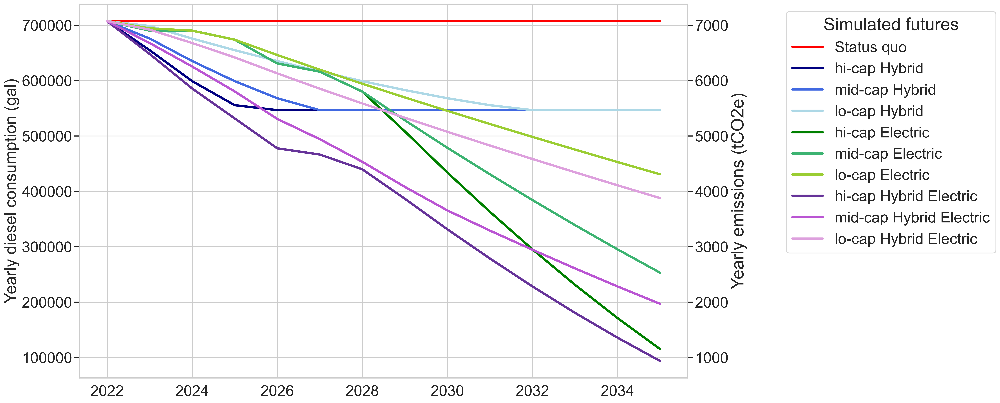

In [39]:
plt.figure(figsize=(25, 10), dpi=400)

custom_palette = {
    "Status quo": "black",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}


custom_palette = {
    "Status quo": "red",
    "lo-cap Hybrid": "lightblue",
    "mid-cap Hybrid": "royalblue",
    "hi-cap Hybrid": "navy",
    "lo-cap Hybrid Electric": "plum",
    "mid-cap Hybrid Electric": "mediumorchid",
    "hi-cap Hybrid Electric": "rebeccapurple",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}

# Create the primary y-axis
ax = plt.gca()

# Use a loop to plot each category with its unique marker and color
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='YearlyResult', label=label, dashes=False, 
                 color=custom_palette[label], linewidth = 4, ax=ax)

# Add titles and labels for primary y-axis
ax.set_xlabel('', fontsize=28)
ax.set_ylabel('Yearly diesel consumption (gal)', fontsize=28)
ax.legend(title='Simulated futures', bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=26, title_fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=26)

# Create secondary y-axis
ax2 = ax.twinx()

# Plot CO2 data on the secondary y-axis. I'm using a dashed line here, but you can customize as needed.
#for label in unique_labels:
#    subset = final_df[final_df['Label'] == label]
#    sns.lineplot(data=subset, x='Year', y='CO2', dashes=True, color=custom_palette[label], ax=ax2, linewidth=2.5, legend=False)


primary_ticks = ax.get_yticks()
conversion_factor = 0.01
# Calculate secondary axis ticks and limits
secondary_ticks = primary_ticks * conversion_factor
primary_limits = ax.get_ylim()
secondary_limits = (primary_limits[0] * conversion_factor, primary_limits[1] * conversion_factor)


# Set secondary axis ticks and limits
ax2.set_yticks(secondary_ticks)
ax2.set_ylim(secondary_limits)
ax2.set_ylabel('Yearly emissions (tCO2e)', fontsize=30)
ax2.tick_params(axis='y', which='major', labelsize=26)

ax.grid(True)
ax2.grid(False) 

# Save and display the plot
plt.tight_layout()
plt.savefig(r'../../figures/yearly-diesel-consumption-and-emissions.png', dpi=400)
plt.show()


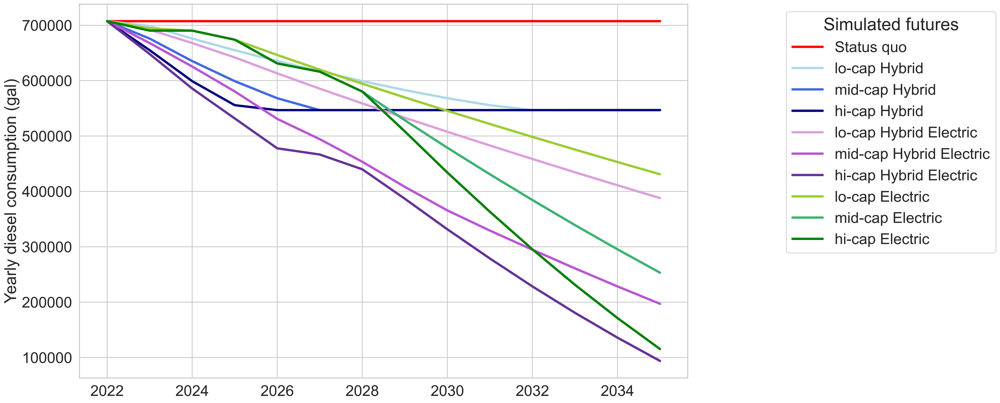

In [40]:
# List of unique labels in the desired order
unique_labels = ["Status quo", "lo-cap Hybrid", "mid-cap Hybrid", "hi-cap Hybrid",
                 "lo-cap Hybrid Electric", "mid-cap Hybrid Electric", "hi-cap Hybrid Electric",
                 "lo-cap Electric", "mid-cap Electric", "hi-cap Electric"]

# Custom palette
custom_palette = {
    "Status quo": "red",
    "lo-cap Hybrid": "lightblue",
    "mid-cap Hybrid": "royalblue",
    "hi-cap Hybrid": "navy",
    "lo-cap Hybrid Electric": "plum",
    "mid-cap Hybrid Electric": "mediumorchid",
    "hi-cap Hybrid Electric": "rebeccapurple",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}

plt.figure(figsize=(25, 10), dpi=400)

# Create the primary y-axis
ax = plt.gca()

# Use a loop to plot each category with its unique marker and color
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='YearlyResult', label=label, dashes=False,
                 color=custom_palette[label], linewidth=4, ax=ax)

# Add titles and labels for primary y-axis
ax.set_xlabel('', fontsize=28)
ax.set_ylabel('Yearly diesel consumption (gal)', fontsize=28)

# Create a custom legend
handles, _ = ax.get_legend_handles_labels()
ordered_handles = [handles[unique_labels.index(label)] for label in unique_labels]
ax.legend(ordered_handles, unique_labels, title='Simulated futures', bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=26, title_fontsize=30)

ax.tick_params(axis='both', which='major', labelsize=26)

ax.grid(True)

# Save and display the plot
plt.tight_layout()
plt.savefig(r'../../figures/yearly-diesel-consumption-and-emissions.png', dpi=400)
plt.show()

In [41]:
final_df['YearlyResult100000gals']= final_df['YearlyResult']/100000

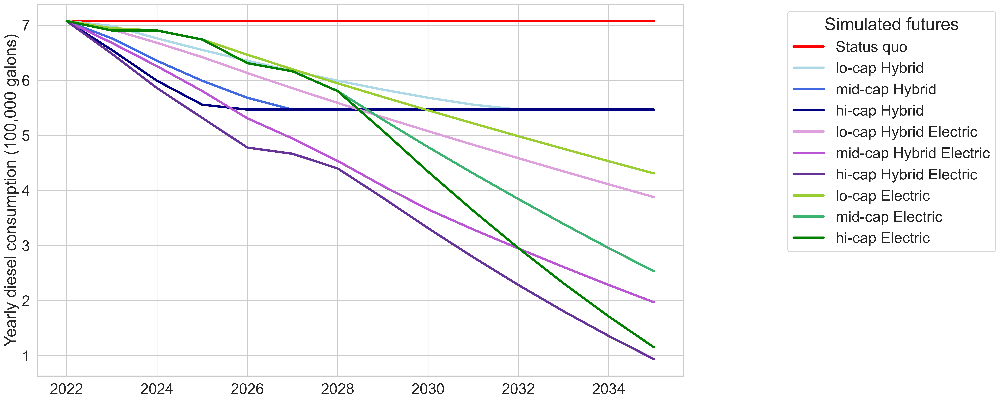

In [42]:
plt.figure(figsize=(25, 10), dpi=400)

# Create the primary y-axis
ax = plt.gca()
    
# Use a loop to plot each category with its unique marker and color
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='YearlyResult100000gals', label=label, dashes=False,
                 color=custom_palette[label], linewidth=4, ax=ax)

# Add titles and labels for primary y-axis
ax.set_xlabel('', fontsize=28)
ax.set_ylabel('Yearly diesel consumption (100,000 galons)', fontsize=28)
ax.legend(title='Simulated futures', bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=26, title_fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=26)


# Save and display the plot
plt.tight_layout()
plt.savefig(r'../../figures/yearly-diesel-consumption-and-emissions.png', dpi=400)
plt.show()


In [43]:
final_df['Label'].unique()

array(['Status quo', 'hi-cap Hybrid', 'mid-cap Hybrid', 'lo-cap Hybrid',
       'hi-cap Electric', 'mid-cap Electric', 'lo-cap Electric',
       'hi-cap Hybrid Electric', 'mid-cap Hybrid Electric',
       'lo-cap Hybrid Electric'], dtype=object)

In [44]:
final_df['Label'] = final_df['Label'].replace('hi-cap+Electric', 'hi-cap Electric')
final_df['Label'] = final_df['Label'].replace('hi-cap Hybrid Electric', 'hi-cap Hybrid+Electric')
final_df['Label'] = final_df['Label'].replace('mid-cap Hybrid Electric', 'mid-cap Hybrid+Electric')
final_df['Label'] = final_df['Label'].replace('lo-cap Hybrid Electric', 'lo-cap Hybrid+Electric')
final_df['Label'].unique()

array(['Status quo', 'hi-cap Hybrid', 'mid-cap Hybrid', 'lo-cap Hybrid',
       'hi-cap Electric', 'mid-cap Electric', 'lo-cap Electric',
       'hi-cap Hybrid+Electric', 'mid-cap Hybrid+Electric',
       'lo-cap Hybrid+Electric'], dtype=object)

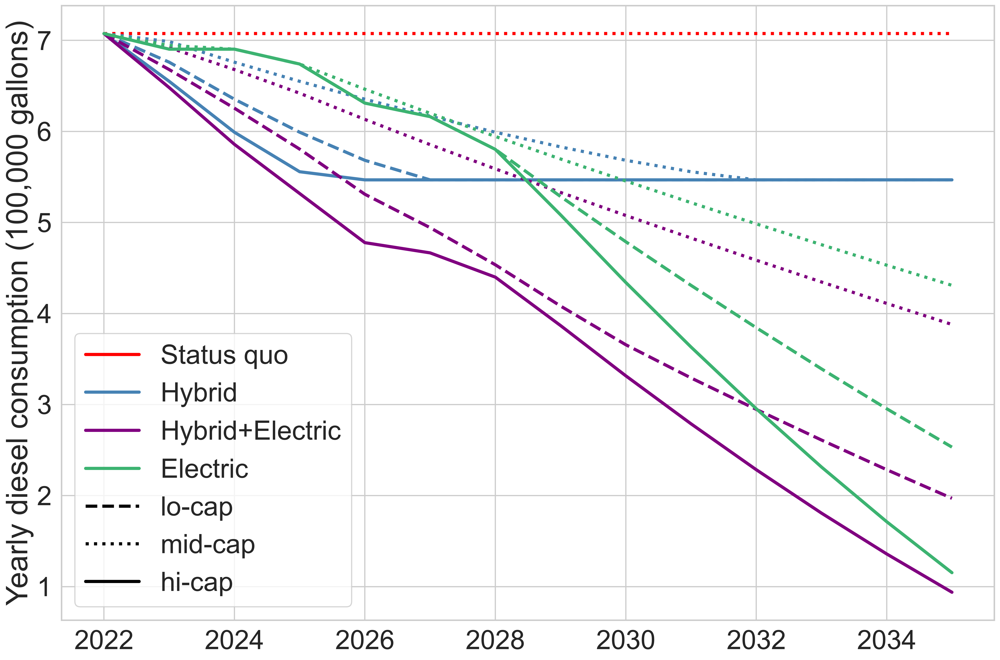

In [53]:
import matplotlib.lines as mlines

unique_labels = ["Status quo", "lo-cap Hybrid", "mid-cap Hybrid", "hi-cap Hybrid",
                 "lo-cap Hybrid+Electric", "mid-cap Hybrid+Electric", "hi-cap Hybrid+Electric",
                 "lo-cap Electric", "mid-cap Electric", "hi-cap Electric"]

# Updated custom palette and custom linestyles from the second plot
custom_palette = {
    'Status quo': 'red',
    'lo-cap Hybrid': 'steelblue',
    'mid-cap Hybrid': 'steelblue',
    'hi-cap Hybrid': 'steelblue',
    'lo-cap Hybrid+Electric': 'purple',
    'mid-cap Hybrid+Electric': 'purple',
    'hi-cap Hybrid+Electric': 'purple',
    'lo-cap Electric': 'mediumseagreen',
    'mid-cap Electric': 'mediumseagreen',
    'hi-cap Electric': 'mediumseagreen'
}

custom_linestyles = {
    'Status quo': 'dotted',
    'lo-cap Hybrid': 'dotted',
    'lo-cap Hybrid+Electric': 'dotted',
    'lo-cap Electric': 'dotted',
    'mid-cap Hybrid': 'dashed',
    'mid-cap Hybrid+Electric': 'dashed',
    'mid-cap Electric': 'dashed',
    'hi-cap Hybrid': 'solid',
    'hi-cap Hybrid+Electric': 'solid',
    'hi-cap Electric': 'solid',
}

# Plotting code modification
plt.figure(figsize=(18, 12), dpi=400)
ax = plt.gca()

# Use a loop to plot each category with its unique marker, color, and linestyle
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='YearlyResult100000gals', label=label,
                 color=custom_palette[label], linestyle=custom_linestyles[label], linewidth=4, ax=ax)

# Adjust the legend, titles, and labels to match the style
ax.set_xlabel('', fontsize=38)
ax.set_ylabel('Yearly diesel consumption (100,000 gallons)', fontsize=38)
#ax.legend(title='Simulated futures', bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=26, title_fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=34)

# Creating custom legend handles
# For colors
hybrid_handle = mlines.Line2D([], [], color='steelblue', label='Hybrid', linewidth=4)
hybrid_electric_handle = mlines.Line2D([], [], color='purple', label='Hybrid+Electric', linewidth=4)
electric_handle = mlines.Line2D([], [], color='mediumseagreen', label='Electric', linewidth=4)
status_quo_handle = mlines.Line2D([], [], color='red', label='Status quo', linewidth=4)


# For line patterns
lo_cap_handle = mlines.Line2D([], [], color='black', linestyle='dashed', label='lo-cap', linewidth=4)
mid_cap_handle = mlines.Line2D([], [], color='black', linestyle='dotted', label='mid-cap', linewidth=4)
hi_cap_handle = mlines.Line2D([], [], color='black', linestyle='solid', label='hi-cap', linewidth=4)


# For 'Status quo'
#status_quo_handle = mlines.Line2D([], [], color='red', linestyle='solid', label='Status quo', linewidth=4)



# Add the legend to the plot
plt.legend(handles=[status_quo_handle, hybrid_handle, hybrid_electric_handle, electric_handle, 
                    lo_cap_handle, mid_cap_handle, hi_cap_handle], loc='best', fontsize=34)
# Save and display the plot
plt.tight_layout()
plt.savefig(r'../../figures/yearly-diesel-consumption-and-emissions.png', dpi=400)
plt.show()


In [191]:
final_df.loc[final_df['Year']==2035]

,Year,Result,Scenario,Strategy,Label,YearlyResult,CO2,YearlyResult10000gals
13,2035,2738.750000,c,SQ,Status quo,707460.738888,7689.242204,70.746074
27,2035,2116.837171,h,FH,hi-cap Hybrid,546811.205514,5943.176162,54.681121
41,2035,2116.837171,m,FH,mid-cap Hybrid,546811.205514,5943.176162,54.681121
55,2035,2116.799668,l,FH,lo-cap Hybrid,546801.517919,5943.070870,54.680152
69,2035,446.605208,h,FE,hi-cap Electric,115364.911265,1253.876994,11.536491
83,2035,980.418759,m,FE,mid-cap Electric,253257.062328,2752.597826,25.325706
97,2035,1668.325227,l,FE,lo-cap Electric,430953.755472,4683.945868,43.095376
111,2035,363.367102,h,BM,hi-cap Hybrid+Electric,93863.243751,1020.179885,9.386324
125,2035,762.817512,m,BM,mid-cap Hybrid+Electric,197047.354044,2141.666311,19.704735
139,2035,1501.994164,l,BM,lo-cap Hybrid+Electric,387987.914585,4216.959166,38.798791


In [183]:
# Group by 'Label' and sum 'Result'
summed_results = final_df.groupby('Label')['YearlyResult'].sum().reset_index()

# Find the sum of 'Result' for 'Status quo' label
do_nothing_value = summed_results[summed_results['Label'] == 'Status quo']['YearlyResult'].values[0]

# Compute % decrease relative to 'Status quo'
summed_results['% Decrease'] = 100 * (do_nothing_value - summed_results['YearlyResult']) / do_nothing_value

summed_results

,Label,YearlyResult,% Decrease
0,Status quo,9.904450e+06,0.000000
1,hi-cap Electric,6.709122e+06,32.261544
2,hi-cap Hybrid,7.985359e+06,19.376049
3,hi-cap Hybrid+Electric,5.493947e+06,44.530518
4,lo-cap Electric,8.122233e+06,17.994106
5,lo-cap Hybrid,8.482770e+06,14.353959
6,lo-cap Hybrid+Electric,7.683014e+06,22.428664
7,mid-cap Electric,7.300477e+06,26.290945
8,mid-cap Hybrid,8.107497e+06,18.142888
9,mid-cap Hybrid+Electric,6.144831e+06,37.958893


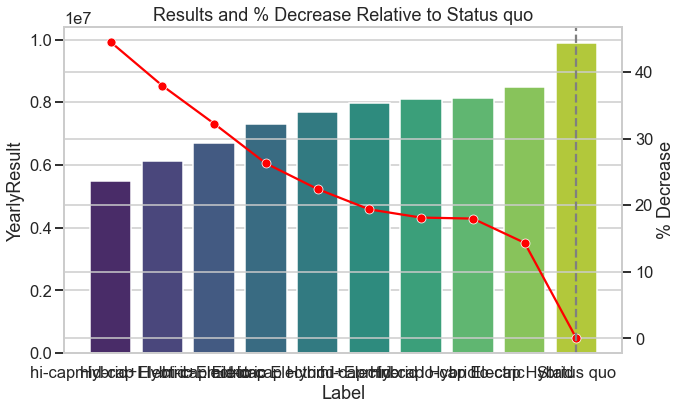

In [184]:
# Group by 'Label' and sum 'Result'
summed_results = final_df.groupby('Label')['YearlyResult'].sum().reset_index()

# Compute % decrease relative to 'Status quo'
do_nothing_value = summed_results[summed_results['Label'] == 'Status quo']['YearlyResult'].values[0]
summed_results['% Decrease'] = 100 * (do_nothing_value - summed_results['YearlyResult']) / do_nothing_value

# Order dataframe based on 'Result'
summed_results = summed_results.sort_values('YearlyResult')

# Plot
plt.figure(figsize=(10, 6))

# Bar plot
sns.barplot(x='Label', y='YearlyResult', data=summed_results, palette='viridis')

# Line plot for % Decrease
ax2 = plt.gca().twinx()
sns.lineplot(x='Label', y='% Decrease', data=summed_results, ax=ax2, color='red', marker="o")

# Highlight 'Status quo'
plt.axvline(x=summed_results['Label'].tolist().index('Status quo'), color='grey', linestyle='--')

# Legends and titles
plt.title('Results and % Decrease Relative to Status quo')
plt.gca().set(ylabel='% Decrease')
plt.show()

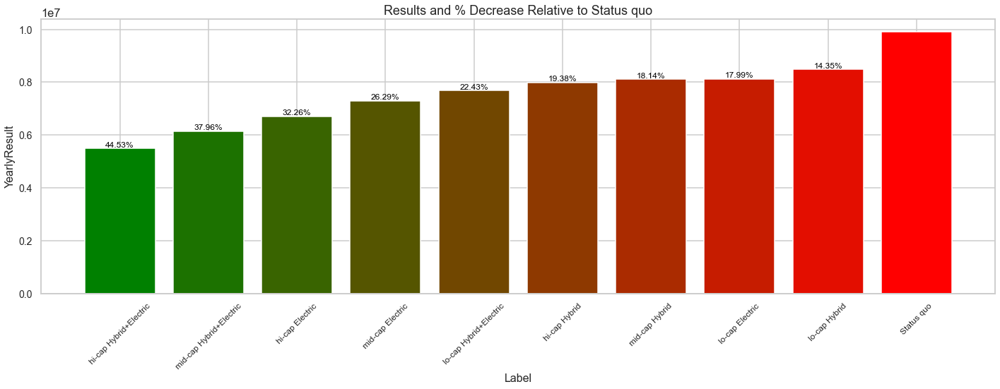

In [185]:
# Group by 'Label' and sum 'Result'
mean_results = final_df.groupby('Label')['YearlyResult'].sum().reset_index()

# Compute % decrease relative to 'Status quo'
do_nothing_value = mean_results[mean_results['Label'] == 'Status quo']['YearlyResult'].values[0]
mean_results['% Decrease'] = 100 * (do_nothing_value - mean_results['YearlyResult']) / do_nothing_value

# Order dataframe based on 'Result'
mean_results = mean_results.sort_values('YearlyResult')

# Create custom colormap
colors = ["green", "red"]  # Reversed the order for proper gradient
cmap = LinearSegmentedColormap.from_list('custom', colors, N=len(mean_results))

# Derive bar colors from colormap
bar_colors = [cmap(i) for i in np.linspace(0, 1, len(mean_results))]

# Plot
plt.figure(figsize=(20, 8))
bars = plt.bar(mean_results['Label'], mean_results['YearlyResult'], color=bar_colors)

# Annotations on top of each bar
for idx, rect in enumerate(bars):
    height = rect.get_height()
    if mean_results.iloc[idx]['Label'] != 'Status quo':
        plt.annotate(f"{mean_results.iloc[idx]['% Decrease']:.2f}%",
                     xy=(rect.get_x() + rect.get_width() / 2, height + 2),  # Adding a small offset on y for clarity
                     ha='center', va='bottom', fontsize=12, color='black')

# Style adjustments
plt.xticks(fontsize=12, rotation=45)  # Increased font size and rotated ticks by 45 degrees
plt.yticks(fontsize=14)
plt.xlabel('Label', fontsize=16)
plt.ylabel('YearlyResult', fontsize=16)
plt.title('Results and % Decrease Relative to Status quo', fontsize=18)
plt.tight_layout()
plt.show()


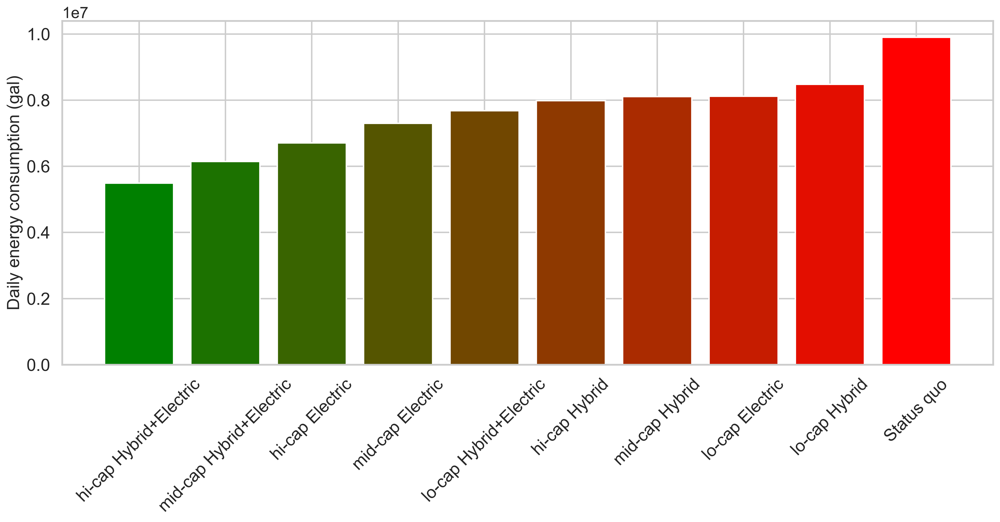

In [186]:
# Group by 'Label' and sum 'Result'
mean_results = final_df.groupby('Label')['YearlyResult'].sum().reset_index()

# Compute % decrease relative to 'Status quo'
do_nothing_value = mean_results[mean_results['Label'] == 'Status quo']['YearlyResult'].values[0]
mean_results['% Decrease'] = 100 * (do_nothing_value - mean_results['YearlyResult']) / do_nothing_value

# Order dataframe based on 'Result'
mean_results = mean_results.sort_values('YearlyResult')

# Create custom colormap
colors = ["green", "red"]  # Reversed the order for proper gradient
cmap = LinearSegmentedColormap.from_list('custom', colors, N=len(mean_results))

# Derive bar colors from colormap
bar_colors = [cmap(i) for i in np.linspace(0, 1, len(mean_results))]

# Plot
plt.figure(figsize=(15, 8), dpi=400)  # Increased size
bars = plt.bar(mean_results['Label'], mean_results['YearlyResult'], color=bar_colors)

# Style adjustments
plt.xticks(fontsize=18, rotation=45)  # Increased font size and rotated ticks by 45 degrees
plt.yticks(fontsize=18)  # Increased font size
#plt.xlabel('Label', fontsize=20)  # Increased font size
plt.ylabel('Daily energy consumption (gal)', fontsize=18)  # Increased font size
#plt.title('Results and % Decrease Relative to Status quo', fontsize=24)  # Increased font size
# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/mean-diesel-consumption.png', dpi=400)  
plt.show()


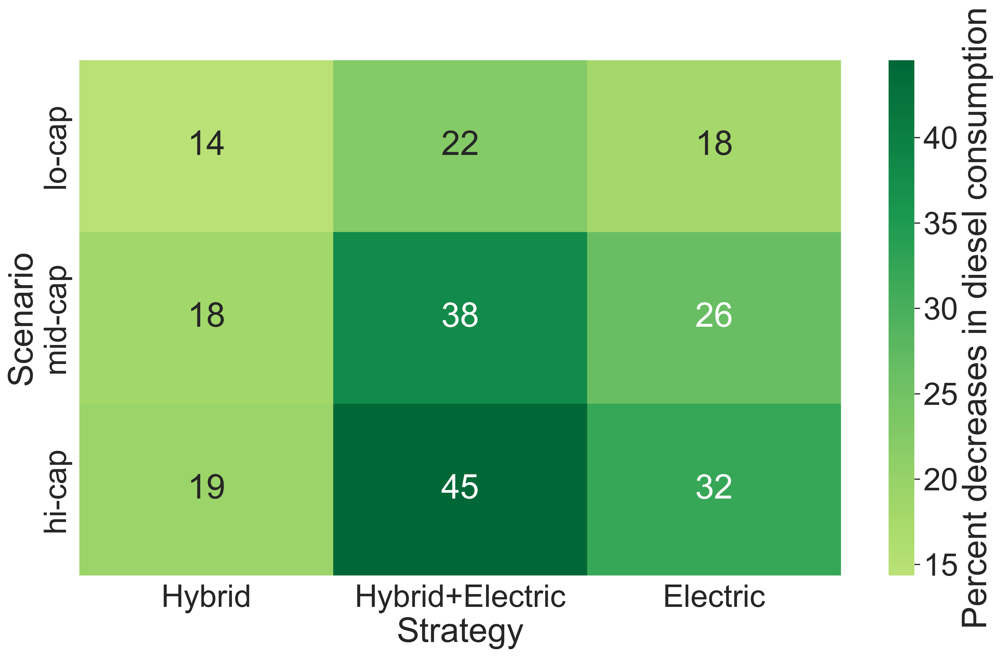

In [149]:
# Pivot dataframe to get desired structure
aggregated_df = final_df.groupby(['Scenario', 'Strategy'])['YearlyResult'].sum().reset_index().copy()

# Mapping for Scenario and Strategy columns
scenario_mapping = {
    'l': 'lo-cap',
    'm': 'mid-cap',
    'h': 'hi-cap',
    'c': 'lo-cap'   
}

strategy_mapping = {
    'SQ': 'Status quo',
    'FH': 'Hybrid',
    'BM': 'Hybrid+Electric',
    'FE': 'Electric'
}

# Replace values in the columns
aggregated_df['Scenario'] = aggregated_df['Scenario'].replace(scenario_mapping)
aggregated_df['Strategy'] = aggregated_df['Strategy'].replace(strategy_mapping)

#pivot_df = aggregated_df.pivot('Scenario', 'Strategy', 'YearlyResult')
pivot_df = aggregated_df.pivot(index='Scenario', columns='Strategy', values='YearlyResult')

column_order = ['Status quo', 'Hybrid', 'Hybrid+Electric', 'Electric']
pivot_df = pivot_df[column_order]


# Compute %Decrease
reference_value = pivot_df.loc['lo-cap', 'Status quo']

pivot_df = ((reference_value - pivot_df ) / reference_value) * 100

# Drop Scenario 'c' and Strategy 'Status quo'
#pivot_df = pivot_df.drop('c', axis=0)
pivot_df = pivot_df.drop('Status quo', axis=1)

# Find min and max percentage decrease values
vmin_value, vmax_value = pivot_df.min().min(), pivot_df.max().max()

# Define the desired order for the y-axis
y_axis_order = ['lo-cap', 'mid-cap', 'hi-cap']

# Manually reorder the rows of the DataFrame based on the desired order
pivot_df = pivot_df.loc[y_axis_order]

# Plot heatmap
plt.figure(figsize=(18, 10), dpi=400)
sns.set(font_scale=3)
sns.heatmap(pivot_df, annot=True, fmt='.0f', cmap='RdYlGn', cbar_kws={'label': 'Percent decreases in diesel consumption'}, center=0, vmin=vmin_value, vmax=vmax_value)

#plt.title("Percentage Decrease Heatmap based on Scenario and Strategy")
plt.savefig(r'../../figures/decrease-diesel-heatmap.png', dpi=400)  

plt.show()


In [150]:
pivot_df

Strategy,Hybrid,Hybrid+Electric,Electric
Scenario,,,
lo-cap,14.353959,22.428664,17.994106
mid-cap,18.142888,37.958893,26.290945
hi-cap,19.376049,44.530518,32.261544


In [151]:
final_df.loc[final_df['Strategy'] == 'SQ', 'Scenario'] = 'l'
final_df

,Year,Result,Scenario,Strategy,Label,YearlyResult,CO2,YearlyResult10000gals
0,2022,2738.750000,l,SQ,Status quo,707460.738888,7689.242204,70.746074
1,2023,2738.750000,l,SQ,Status quo,707460.738888,7689.242204,70.746074
2,2024,2738.750000,l,SQ,Status quo,707460.738888,7689.242204,70.746074
3,2025,2738.750000,l,SQ,Status quo,707460.738888,7689.242204,70.746074
4,2026,2738.750000,l,SQ,Status quo,707460.738888,7689.242204,70.746074
...,...,...,...,...,...,...,...,...
135,2031,1869.475807,l,BM,lo-cap Hybrid+Electric,482914.006665,5248.690926,48.291401
136,2032,1775.253148,l,BM,lo-cap Hybrid+Electric,458574.862181,4984.153876,45.857486
137,2033,1682.534231,l,BM,lo-cap Hybrid+Electric,434624.157104,4723.838692,43.462416
138,2034,1591.483218,l,BM,lo-cap Hybrid+Electric,411104.296973,4468.206272,41.110430


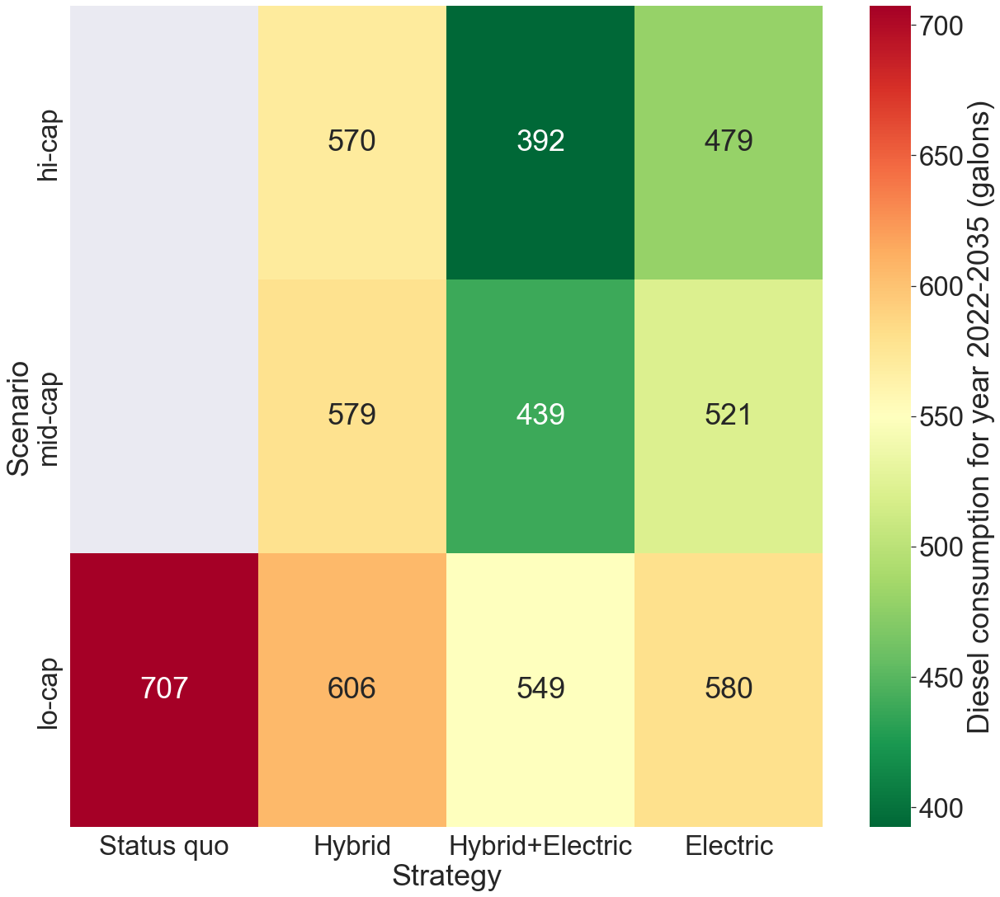

In [152]:
# Improve the plot
df_emission = final_df.copy()

# Mapping for Scenario and Strategy columns
scenario_mapping = {
    'l': 'lo-cap',
    'm': 'mid-cap',
    'h': 'hi-cap',
}

strategy_mapping = {
    'SQ': 'Status quo',
    'FH': 'Hybrid',
    'BM': 'Hybrid+Electric',
    'FE': 'Electric'
}

# Replace values in the columns
df_emission['Scenario'] = df_emission['Scenario'].replace(scenario_mapping)
df_emission['Strategy'] = df_emission['Strategy'].replace(strategy_mapping)

df_emission['YearlyResult-1000gallons'] = df_emission['YearlyResult']/1000

pivot_df_emission = df_emission.pivot_table(values='YearlyResult-1000gallons', index='Scenario', columns='Strategy', aggfunc='mean')

# Reorder the columns of pivot_df_emission
column_order = ['Status quo', 'Hybrid', 'Hybrid+Electric', 'Electric']
pivot_df_emission = pivot_df_emission[column_order]

# Define the desired order for the y-axis
y_axis_order = ['hi-cap','mid-cap','lo-cap']

# Manually reorder the rows of the DataFrame based on the desired order
pivot_df_emission = pivot_df_emission.loc[y_axis_order]

vmin_value = pivot_df_emission.min().min()
vmax_value = pivot_df_emission.max().max()

# Set the aesthetics
sns.set_style("whitegrid")
sns.set_context("talk")

plt.figure(figsize=(18, 16))

# Create heatmap
sns.set(font_scale=3)
sns.heatmap(pivot_df_emission, annot=True, fmt='.0f', cmap='RdYlGn_r', cbar_kws={'label': 'Diesel consumption for year 2022-2035 (10000 galons)'}, vmin=vmin_value, vmax=vmax_value)

# Add titles and labels
# Uncomment these lines if you want to include titles and labels
#plt.title('CO2 Emission Heatmap', fontsize=20)
#plt.xlabel('Strategy', fontsize=40)
#plt.ylabel('Scenario', fontsize=40)
#plt.xticks(fontsize=32, rotation=45)
#plt.yticks(fontsize=32)

# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/diesel-total-heatmap.png', dpi=400)

# Display the plot
plt.show()


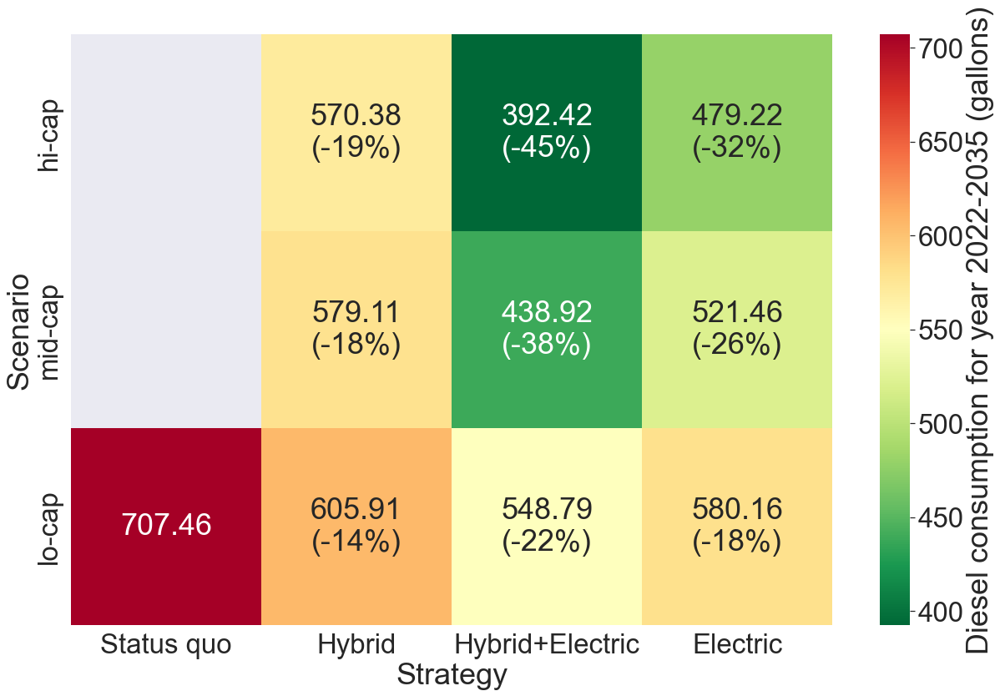

In [153]:
# Creating a pivot table for heatmap
pivot_df_emission_numeric = df_emission.pivot_table(values='YearlyResult-1000gallons', index='Scenario', columns='Strategy', aggfunc='mean')

# Initialize the annotations dataframe with the same indices and columns
annotations = pd.DataFrame(index=pivot_df_emission_numeric.index, columns=pivot_df_emission_numeric.columns)

# First, find the 'Status quo' value in the 'lo-cap' row
status_quo_value = pivot_df_emission_numeric.loc['lo-cap', 'Status quo']

# Now calculate the percentage decrease relative to the 'Status quo' value
for strategy in pivot_df_emission_numeric.columns:
    if strategy != 'Status quo':
        # Apply the percentage calculation to each strategy
        annotations[strategy] = pivot_df_emission_numeric[strategy].apply(
            lambda x: f"{x:.2f}\n({-(1 - x / status_quo_value) * 100:.0f}%)" if status_quo_value != 0 else f"{x:.2f}\n(N/A)"
        )
    else:
        # For 'Status quo', simply annotate with the value
        annotations[strategy] = pivot_df_emission_numeric[strategy].apply(lambda x: f"{x:.2f}")


# Reorder the columns and rows
pivot_df_emission_numeric = pivot_df_emission_numeric[['Status quo', 'Hybrid', 'Hybrid+Electric', 'Electric']]
pivot_df_emission_numeric = pivot_df_emission_numeric.loc[['hi-cap', 'mid-cap', 'lo-cap']]
annotations = annotations[['Status quo', 'Hybrid', 'Hybrid+Electric', 'Electric']]
annotations = annotations.loc[['hi-cap', 'mid-cap', 'lo-cap']]

# Setting minimum and maximum values for color bar
vmin_value = pivot_df_emission_numeric.min().min()
vmax_value = pivot_df_emission_numeric.max().max()

# Set the aesthetics
sns.set_style("whitegrid")
sns.set_context("talk")
plt.figure(figsize=(18, 12))

# Create heatmap with numeric values and annotate with formatted strings
sns.set(font_scale=3)
ax = sns.heatmap(pivot_df_emission_numeric, annot=annotations.values, fmt='', cmap='RdYlGn_r', cbar_kws={'label': 'Diesel consumption for year 2022-2035 (10000 gallons)'}, vmin=vmin_value, vmax=vmax_value)

# Add titles and labels
#plt.xlabel('Strategy', fontsize=16)
#plt.ylabel('Scenario', fontsize=16)
#plt.xticks(fontsize=14, rotation=45)
#plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()

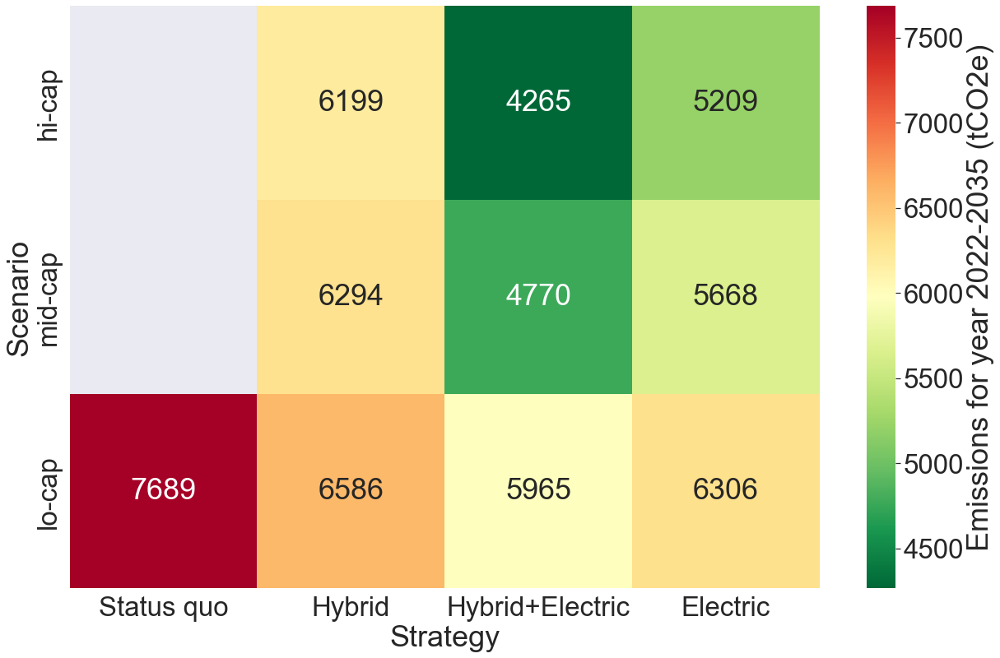

In [154]:
# Improve the plot
df_emission = final_df.copy()

# Mapping for Scenario and Strategy columns
scenario_mapping = {
    'l': 'lo-cap',
    'm': 'mid-cap',
    'h': 'hi-cap',
}

strategy_mapping = {
    'SQ': 'Status quo',
    'FH': 'Hybrid',
    'BM': 'Hybrid+Electric',
    'FE': 'Electric'
}

# Replace values in the columns
df_emission['Scenario'] = df_emission['Scenario'].replace(scenario_mapping)
df_emission['Strategy'] = df_emission['Strategy'].replace(strategy_mapping)

pivot_df_emission = df_emission.pivot_table(values='CO2', index='Scenario', columns='Strategy', aggfunc='mean')

# Reorder the columns of pivot_df_emission
column_order = ['Status quo', 'Hybrid', 'Hybrid+Electric', 'Electric']
pivot_df_emission = pivot_df_emission[column_order]

# Define the desired order for the y-axis
y_axis_order = ['hi-cap','mid-cap','lo-cap']

# Manually reorder the rows of the DataFrame based on the desired order
pivot_df_emission = pivot_df_emission.loc[y_axis_order]

vmin_value = pivot_df_emission.min().min()
vmax_value = pivot_df_emission.max().max()

# Set the aesthetics
sns.set_style("whitegrid")
sns.set_context("talk")

plt.figure(figsize=(18, 12))

# Create heatmap
sns.set(font_scale=3)
sns.heatmap(pivot_df_emission, annot=True, fmt='.0f', cmap='RdYlGn_r', cbar_kws={'label': 'Emissions for year 2022-2035 (tCO2e)'}, vmin=vmin_value, vmax=vmax_value)

# Add titles and labels
# Uncomment these lines if you want to include titles and labels
#plt.title('CO2 Emission Heatmap', fontsize=20)
#plt.xlabel('Strategy', fontsize=40)
#plt.ylabel('Scenario', fontsize=40)
#plt.xticks(fontsize=32, rotation=45)
#plt.yticks(fontsize=32)

# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/co2-emission-heatmap.png', dpi=400)

# Display the plot
plt.show()


In [155]:
pivot_df_emission=pivot_df_emission/1000

In [156]:
pivot_df_emission

Strategy,Status quo,Hybrid,Hybrid+Electric,Electric
Scenario,,,,
hi-cap,NaN,6.199371,4.265183,5.208574
mid-cap,NaN,6.294192,4.770491,5.667668
lo-cap,7.689242,6.585532,5.964648,6.305632


In [157]:
df_emission['CO21000']=df_emission['CO2']/1000

In [158]:
pivot_df_emission.to_pickle(r'../../results/pivot_df_emission.pkl')

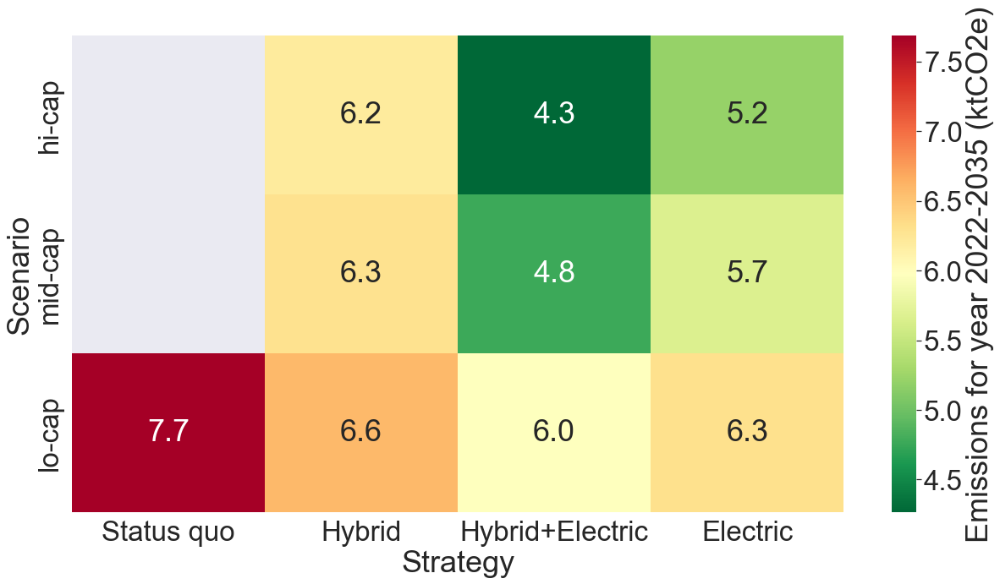

In [159]:
# Reorder the columns of pivot_df_emission
column_order = ['Status quo', 'Hybrid', 'Hybrid+Electric', 'Electric']
pivot_df_emission = pivot_df_emission[column_order]

# Define the desired order for the y-axis
y_axis_order = ['hi-cap','mid-cap','lo-cap']

# Manually reorder the rows of the DataFrame based on the desired order
pivot_df_emission = pivot_df_emission.loc[y_axis_order]

vmin_value = pivot_df_emission.min().min()
vmax_value = pivot_df_emission.max().max()

# Set the aesthetics
sns.set_style("whitegrid")
sns.set_context("talk")

plt.figure(figsize=(18, 10))

# Create heatmap
sns.set(font_scale=3)
sns.heatmap(pivot_df_emission, annot=True, fmt='.1f', cmap='RdYlGn_r', cbar_kws={'label': 'Emissions for year 2022-2035 (ktCO2e)'}, vmin=vmin_value, vmax=vmax_value)

# Add titles and labels
# Uncomment these lines if you want to include titles and labels
#plt.title('CO2 Emission Heatmap', fontsize=20)
#plt.xlabel('Strategy', fontsize=40)
#plt.ylabel('Scenario', fontsize=40)
#plt.xticks(fontsize=32, rotation=45)
#plt.yticks(fontsize=32)

# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/co2-emission-heatmap.png', dpi=400)

# Display the plot
plt.show()

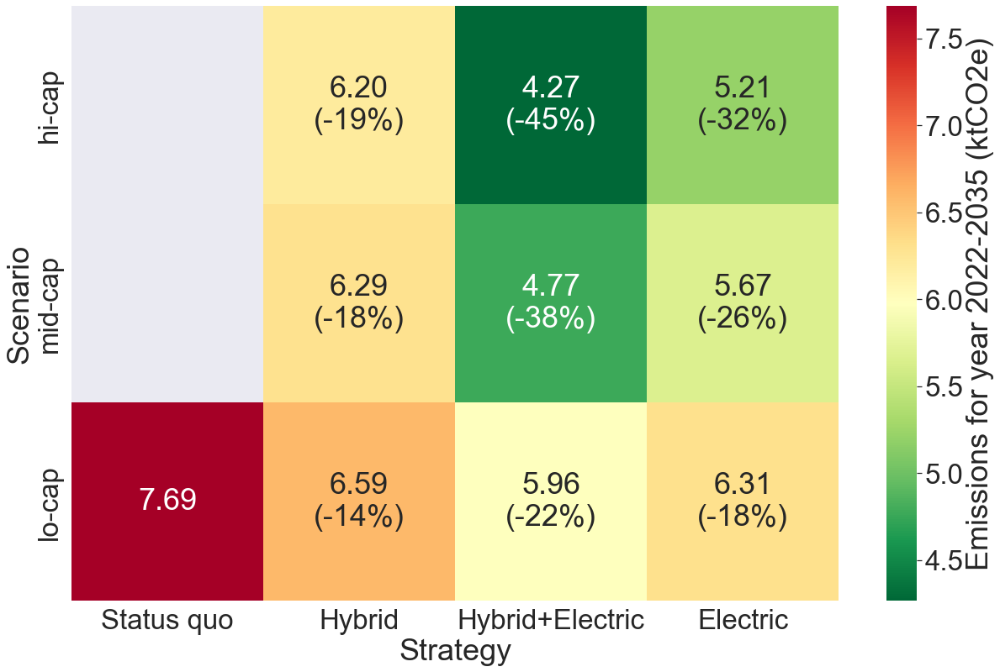

In [160]:
# Creating a pivot table for heatmap
pivot_df_emission_numeric = df_emission.pivot_table(values='CO21000', index='Scenario', columns='Strategy', aggfunc='mean')

# Initialize the annotations dataframe with the same indices and columns
annotations = pd.DataFrame(index=pivot_df_emission_numeric.index, columns=pivot_df_emission_numeric.columns)

# First, find the 'Status quo' value in the 'lo-cap' row
status_quo_value = pivot_df_emission_numeric.loc['lo-cap', 'Status quo']

# Now calculate the percentage decrease relative to the 'Status quo' value
for strategy in pivot_df_emission_numeric.columns:
    if strategy != 'Status quo':
        # Apply the percentage calculation to each strategy
        annotations[strategy] = pivot_df_emission_numeric[strategy].apply(
            lambda x: f"{x:.2f}\n({-(1 - x / status_quo_value) * 100:.0f}%)" if status_quo_value != 0 else f"{x:.2f}\n(N/A)"
        )
    else:
        # For 'Status quo', simply annotate with the value
        annotations[strategy] = pivot_df_emission_numeric[strategy].apply(lambda x: f"{x:.2f}")


# Reorder the columns and rows
pivot_df_emission_numeric = pivot_df_emission_numeric[['Status quo', 'Hybrid', 'Hybrid+Electric', 'Electric']]
pivot_df_emission_numeric = pivot_df_emission_numeric.loc[['hi-cap', 'mid-cap', 'lo-cap']]
annotations = annotations[['Status quo', 'Hybrid', 'Hybrid+Electric', 'Electric']]
annotations = annotations.loc[['hi-cap', 'mid-cap', 'lo-cap']]

# Setting minimum and maximum values for color bar
vmin_value = pivot_df_emission_numeric.min().min()
vmax_value = pivot_df_emission_numeric.max().max()

# Set the aesthetics
sns.set_style("whitegrid")
sns.set_context("talk")
plt.figure(figsize=(18, 12))

# Create heatmap with numeric values and annotate with formatted strings
sns.set(font_scale=3)
ax = sns.heatmap(pivot_df_emission_numeric, annot=annotations.values, fmt='', cmap='RdYlGn_r', cbar_kws={'label': 'Emissions for year 2022-2035 (ktCO2e)'}, vmin=vmin_value, vmax=vmax_value)

# Add titles and labels
#plt.xlabel('Strategy', fontsize=16)
#plt.ylabel('Scenario', fontsize=16)
#plt.xticks(fontsize=14, rotation=45)
#plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()

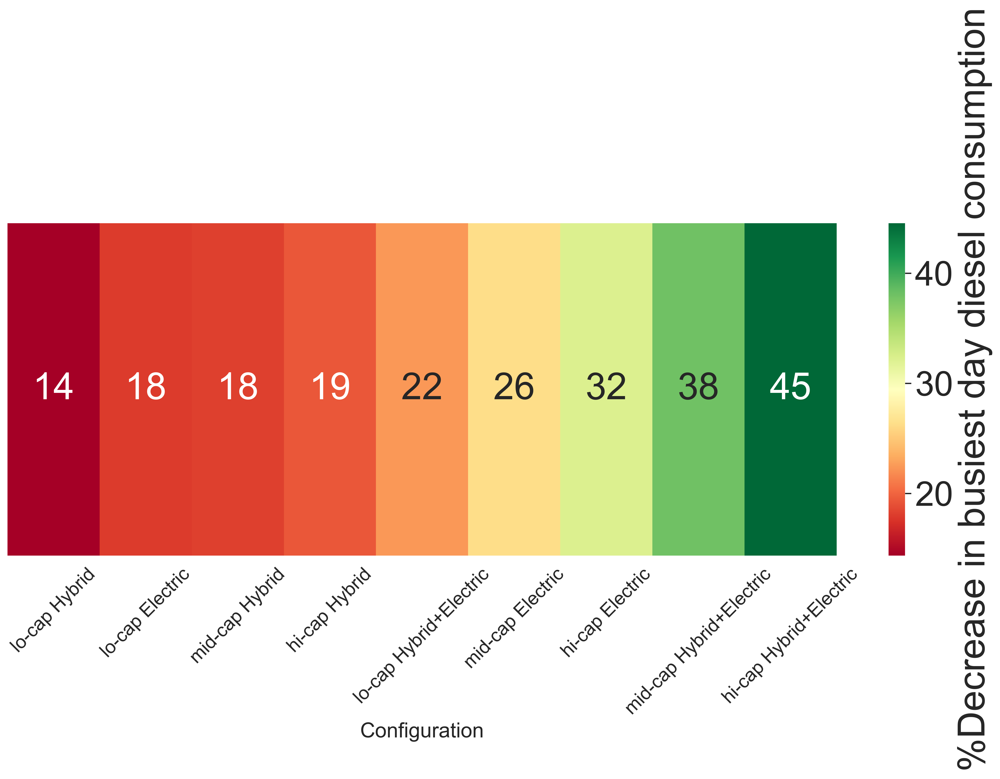

In [161]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter out the "Status quo" configuration
mean_results = mean_results[mean_results['Label'] != 'Status quo']

# Sort the data by % Decrease
mean_results = mean_results.sort_values(by='% Decrease')

# Convert DataFrame to a 2D array suitable for a heatmap
heatmap_data = mean_results.set_index('Label')['% Decrease'].T.values.reshape(1, -1)

plt.figure(figsize=(15, 8), dpi=400)

# Create the heatmap
sns.heatmap(heatmap_data, annot=True, cmap="RdYlGn", cbar_kws={'label': '%Decrease in busiest day diesel consumption'}, xticklabels=mean_results['Label'].tolist())

# Styling
plt.xticks(fontsize=18, rotation=45)
plt.yticks([])  # Hide the y-axis as it's not needed here
plt.xlabel('Configuration', fontsize=20)
#plt.title('% Decrease compared to Status quo across configurations', fontsize=22)

plt.tight_layout()
plt.savefig(r'../../figures/relative-decrease-heatmap.png', dpi=400)
plt.show()


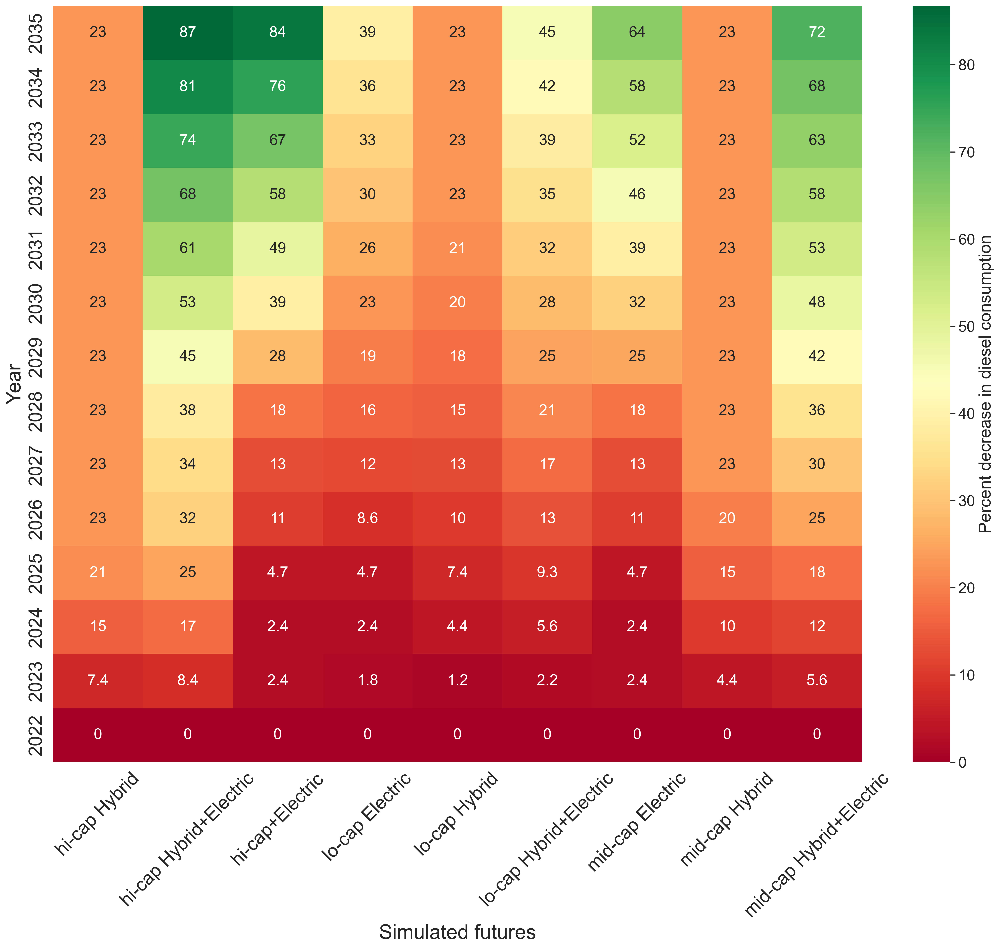

In [162]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate % decrease relative to 'Status quo' for each Year
do_nothing_values = final_df[final_df['Label'] == 'Status quo'].set_index('Year')['Result'].to_dict()
final_df['% Decrease'] = final_df.apply(lambda row: 100 * (do_nothing_values[row['Year']] - row['Result']) / do_nothing_values[row['Year']], axis=1)
#print(final_df['Label'])

future_mapping = {
    'hi-cap Balanced Mix': 'hi-cap Hybrid+Electric',
    'hi-cap Electric': 'hi-cap+Electric',
    'hi-cap Hybrid': 'hi-cap Hybrid',
    'lo-cap Balanced Mix': 'lo-cap Hybrid+Electric',
    'lo-cap Electric': 'lo-cap Electric',
    'lo-cap Hybrid': 'lo-cap Hybrid',    
    'mid-cap Balanced Mix': 'mid-cap Hybrid+Electric',
    'mid-cap Electric': 'mid-cap Electric',
    'mid-cap Hybrid': 'mid-cap Hybrid',
}

# Replace values in the columns
final_df['Label'] = final_df['Label'].replace(future_mapping)

#print(final_df['Label'])


# Remove Status quo rows from the data as it will have a 0% decrease 
final_df = final_df[final_df['Label'] != 'Status quo']

# Pivot data for heatmap
sns.set(font_scale=1.5)
heatmap_data = final_df.pivot_table(index='Year', columns='Label', values='% Decrease')

plt.figure(figsize=(18, 16), dpi=400)

# Create the heatmap and store the returned axis in `ax`.
ax = sns.heatmap(heatmap_data, cmap="RdYlGn", annot=True, cbar_kws={'label': 'Percent decrease in diesel consumption'})

# Reverse the y-axis
ax.invert_yaxis()

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Adjusting the colorbar
cbar = ax.collections[0].colorbar
cbar.ax.figure.subplots_adjust(right=0.8)
cbar.ax.set_ylabel('Percent decrease in diesel consumption', size=20)
cbar.ax.tick_params(labelsize=18)

# Styling
plt.xlabel('Simulated futures', fontsize=24)
plt.ylabel('Year', fontsize=24)

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.tight_layout()
plt.savefig(r'../../figures/yearly-relative-decrease-heatmap.png', dpi=400)
plt.show()


In [163]:
# Pivot data for heatmap
sns.set(font_scale=1.5)

plt.figure(figsize=(22, 20), dpi=400)

# Create the heatmap and store the returned axis in `ax`.
ax = sns.heatmap(heatmap_data, cmap="RdYlGn", annot=False, cbar_kws={'label': 'Percent decrease in diesel consumption'})

# Reverse the y-axis
ax.invert_yaxis()

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Adjusting the colorbar
cbar = ax.collections[0].colorbar
cbar.ax.figure.subplots_adjust(right=0.8)
cbar.ax.set_ylabel('Percent decrease in diesel consumption', size=40)
cbar.ax.tick_params(labelsize=30)

# Styling
plt.xlabel('Simulated futures', fontsize=40)
plt.ylabel('Year', fontsize=40)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
#plt.yticks(rotation=45)


plt.tight_layout()
plt.savefig(r'../../figures/yearly-relative-decrease-heatmap-v02.png', dpi=400)
plt.show()


In [66]:
### Prepare route-based diesel consumption for SQ and hi-cap BM

In [67]:
H_BM_energy = pd.read_csv(r'../../results/highcap-BM-energy-by-routes.csv', low_memory=False)

In [68]:
H_BM_energy = H_BM_energy.loc[H_BM_energy['Year']==12].copy()

In [69]:
H_BM_energy = H_BM_energy.loc[H_BM_energy['Value']==1].copy()

In [70]:
H_BM_energy = H_BM_energy.groupby('Route')[['Coefficient','dist']].sum().reset_index()

In [71]:
H_BM_energy = H_BM_energy.rename(columns={'Coefficient': 'Diesel'})

In [72]:
H_BM_energy['Diesel_per_mile']=H_BM_energy['Diesel']/H_BM_energy['dist']

In [73]:
H_BM_energy.to_csv(r'../../results/highcap-balanced-mix-diesel.csv', index=False)

In [74]:
SQ_filtered['Diesel'] = np.where(SQ_filtered['Powertrain'] != 'electric', SQ_filtered['Energy'], 0)

In [75]:
SQ_filtered = SQ_filtered.groupby('Route')[['Diesel','dist']].sum().reset_index()

In [76]:
SQ_filtered['Diesel_per_mile']=SQ_filtered['Diesel']/SQ_filtered['dist']

In [77]:
SQ_filtered.to_csv(r'../../results/do-nothing-diesel.csv', index=False)

In [ ]:
#PP_energy = pd.read_csv(r'../../results/highcap-PP-optimized-variables-with-replacement-aggregated.csv', low_memory=False)

In [ ]:
#PP_energy = PP_energy.loc[PP_energy['Year']==12].copy()

In [ ]:
#PP_energy = PP_energy.loc[PP_energy['Value']==1].copy()

In [ ]:
#PP_energy = PP_energy.groupby('Route')[['Coefficient','dist']].sum().reset_index()

In [ ]:
#PP_energy = PP_energy.rename(columns={'Coefficient': 'Diesel'})

In [ ]:
#PP_energy['Diesel_per_mile']=PP_energy['Diesel']/PP_energy['dist']

In [79]:
#PP_energy.to_csv(r'../../results/pp-diesel.csv', index=False)

In [78]:
H_FE_energy = pd.read_csv(r'../../results/highcap-FE-optimized-variables-aggregated.csv', low_memory=False)

In [79]:
H_FE_energy = H_FE_energy.loc[H_FE_energy['Year']==12].copy()

In [80]:
H_FE_energy = H_FE_energy.loc[H_FE_energy['Value']==1].copy()

In [81]:
H_FE_energy = H_FE_energy.groupby('Route')[['Coefficient','dist']].sum().reset_index()

In [82]:
H_FE_energy = H_FE_energy.rename(columns={'Coefficient': 'Diesel'})

In [83]:
H_FE_energy['Diesel_per_mile']=H_FE_energy['Diesel']/H_FE_energy['dist']

In [84]:
H_FE_energy.to_csv(r'../../results/FE-diesel.csv', index=False)

In [85]:
H_BM_energy['Diesel'].sum()

341.481417981

In [86]:
SQ_filtered['Diesel'].sum()

3754.3190736247534

In [87]:
#PP_energy['Diesel'].sum()

In [88]:
### Prepare data for cost analysis

In [89]:
initial_values = {
    'HEB': 9,
    'BEB': 15
}

In [90]:
#h_pp = pd.read_csv(r'../../results/highcap-PP-optimized-variables-y.csv', low_memory=False)

# Drop CDBs
#h_pp = h_pp.loc[h_pp['Powertrain'] != 'CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
#h_pp.loc[(h_pp['Year'] == 0) & (h_pp['Powertrain'] == 'HEB'), 'Value'] = 9
#h_pp.loc[(h_pp['Year'] == 0) & (h_pp['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
#h_pp['Diff'] = h_pp.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
#h_pp['Diff'] = h_pp['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
#h_pp['Investment Cost (M$)'] = h_pp.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)


In [91]:
h_FE = pd.read_csv(r'../../results/highcap-FE-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
h_FE = h_FE.loc[h_FE['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_FE.loc[(h_FE['Year'] == 0) & (h_FE['Powertrain'] == 'HEB'), 'Value'] = 9
h_FE.loc[(h_FE['Year'] == 0) & (h_FE['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_FE['Diff'] = h_FE.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_FE['Diff'] = h_FE['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_FE['Investment Cost (M$)'] = h_FE.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [92]:
m_FE = pd.read_csv(r'../../results/midcap-FE-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
m_FE = m_FE.loc[m_FE['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
m_FE.loc[(m_FE['Year'] == 0) & (m_FE['Powertrain'] == 'HEB'), 'Value'] = 9
m_FE.loc[(m_FE['Year'] == 0) & (m_FE['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
m_FE['Diff'] = m_FE.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
m_FE['Diff'] = m_FE['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
m_FE['Investment Cost (M$)'] = m_FE.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [93]:
l_FE = pd.read_csv(r'../../results/lowcap-FE-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
l_FE = l_FE.loc[l_FE['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
l_FE.loc[(l_FE['Year'] == 0) & (l_FE['Powertrain'] == 'HEB'), 'Value'] = 9
l_FE.loc[(l_FE['Year'] == 0) & (l_FE['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
l_FE['Diff'] = l_FE.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
l_FE['Diff'] = l_FE['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
l_FE['Investment Cost (M$)'] = l_FE.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [94]:
h_FH = pd.read_csv(r'../../results/highcap-FH-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
h_FH = h_FH.loc[h_FH['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_FH.loc[(h_FH['Year'] == 0) & (h_FH['Powertrain'] == 'HEB'), 'Value'] = 9
h_FH.loc[(h_FH['Year'] == 0) & (h_FH['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_FH['Diff'] = h_FH.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_FH['Diff'] = h_FH['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_FH['Investment Cost (M$)'] = h_FH.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [95]:
m_FH = pd.read_csv(r'../../results/midcap-FH-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
m_FH = m_FH.loc[m_FH['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
m_FH.loc[(m_FH['Year'] == 0) & (m_FH['Powertrain'] == 'HEB'), 'Value'] = 9
m_FH.loc[(m_FH['Year'] == 0) & (m_FH['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
m_FH['Diff'] = m_FH.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
m_FH['Diff'] = m_FH['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
m_FH['Investment Cost (M$)'] = m_FH.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [96]:
l_FH = pd.read_csv(r'../../results/lowcap-FH-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
l_FH = l_FH.loc[l_FH['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
l_FH.loc[(l_FH['Year'] == 0) & (l_FH['Powertrain'] == 'HEB'), 'Value'] = 9
l_FH.loc[(l_FH['Year'] == 0) & (l_FH['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
l_FH['Diff'] = l_FH.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
l_FH['Diff'] = l_FH['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
l_FH['Investment Cost (M$)'] = l_FH.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [97]:
h_BM = pd.read_csv(r'../../results/highcap-BM-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
h_BM = h_BM.loc[h_BM['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_BM.loc[(h_BM['Year'] == 0) & (h_BM['Powertrain'] == 'HEB'), 'Value'] = 9
h_BM.loc[(h_BM['Year'] == 0) & (h_BM['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_BM['Diff'] = h_BM.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_BM['Diff'] = h_BM['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_BM['Investment Cost (M$)'] = h_BM.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [98]:
m_BM = pd.read_csv(r'../../results/midcap-BM-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
m_BM = m_BM.loc[m_BM['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
m_BM.loc[(m_BM['Year'] == 0) & (m_BM['Powertrain'] == 'HEB'), 'Value'] = 9
m_BM.loc[(m_BM['Year'] == 0) & (m_BM['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
m_BM['Diff'] = m_BM.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
m_BM['Diff'] = m_BM['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
m_BM['Investment Cost (M$)'] = m_BM.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [99]:
l_BM = pd.read_csv(r'../../results/lowcap-BM-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
l_BM = l_BM.loc[l_BM['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
l_BM.loc[(l_BM['Year'] == 0) & (l_BM['Powertrain'] == 'HEB'), 'Value'] = 9
l_BM.loc[(l_BM['Year'] == 0) & (l_BM['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
l_BM['Diff'] = l_BM.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
l_BM['Diff'] = l_BM['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
l_BM['Investment Cost (M$)'] = l_BM.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [100]:
h_FE['Investment Cost (M$)'].sum()

193.70000000000005

In [101]:
h_FE

,Powertrain,Value,Year,Diff,Investment Cost (M$)
14,HEB,9,0,0.0,0.0
15,HEB,9,1,0.0,0.0
16,HEB,9,2,0.0,0.0
17,HEB,9,3,0.0,0.0
18,HEB,9,4,0.0,0.0
19,HEB,9,5,0.0,0.0
20,HEB,9,6,0.0,0.0
21,HEB,9,7,0.0,0.0
22,HEB,9,8,0.0,0.0
23,HEB,9,9,0.0,0.0


In [102]:
# Group by 'Year' and sum 'Investment Cost (M$)'
#h_pp = h_pp.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
#h_pp['future'] = 'PVTA plan'
h_FE = h_FE.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
h_FE['future'] = 'hi-cap Electric'
m_FE = m_FE.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
m_FE['future'] = 'mid-cap Electric'
l_FE = l_FE.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
l_FE['future'] = 'lo-cap Electric'
h_FH = h_FH.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
h_FH['future'] = 'hi-cap Hybrid'
m_FH = m_FH.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
m_FH['future'] = 'mid-cap Hybrid'
l_FH = l_FH.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
l_FH['future'] = 'lo-cap Hybrid'
h_BM = h_BM.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
h_BM['future'] = 'hi-cap Hybrid+Electric'
m_BM = m_BM.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
m_BM['future'] = 'mid-cap Hybrid+Electric'
l_BM = l_BM.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
l_BM['future'] = 'lo-cap Hybrid+Electric'

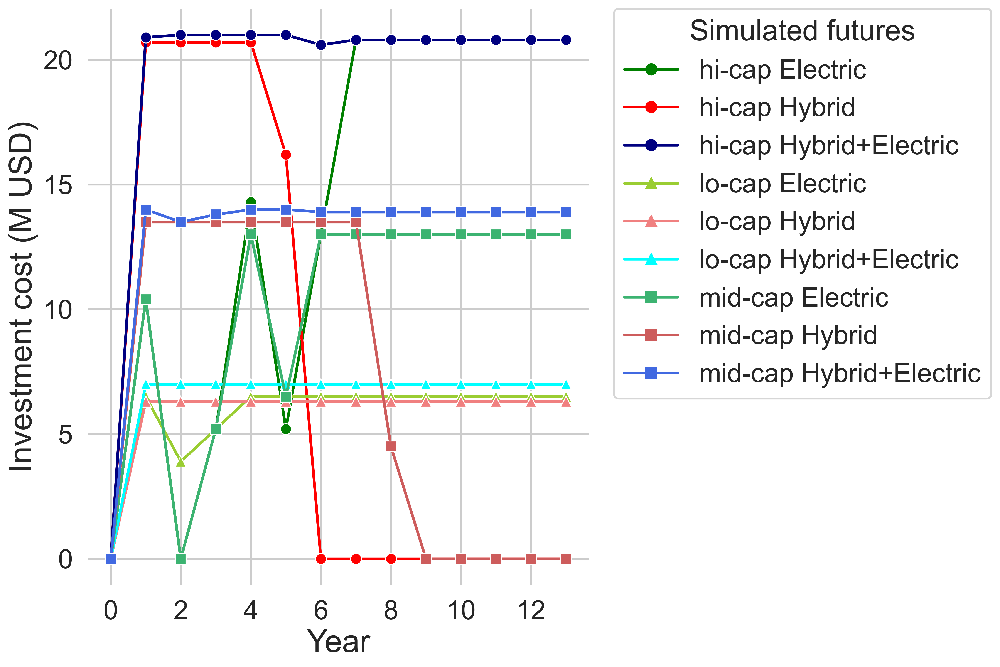

In [103]:
# Define a custom palette and marker order
custom_palette = {
    "Status quo": "black",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid+Electric": "aqua",
    "mid-cap Hybrid+Electric": "royalblue",
    "hi-cap Hybrid+Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}
custom_markers = {
    "Status quo": "P",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid+Electric": "^",
    "mid-cap Hybrid+Electric": "s",
    "hi-cap Hybrid+Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}


# Merge dataframes
dataframes = [h_FE, m_FE, l_FE, h_FH, m_FH, l_FH, h_BM, m_BM, l_BM]  # Add all your dataframes in this list
merged_df = pd.concat(dataframes, ignore_index=True)

# Group by Year and future, then summing up the Investment Cost for each group
grouped_df = merged_df.groupby(['Year', 'future'])['Investment Cost (M$)'].sum().reset_index()

# Get the markers in the same order as the unique values in the 'future' column
markers_order = [custom_markers[future] for future in grouped_df['future'].unique()]


# Plotting with Seaborn
plt.figure(figsize=(12,8), dpi=400)
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger
sns.lineplot(data=grouped_df, x='Year', y='Investment Cost (M$)', hue='future',
                    palette=custom_palette, markers=markers_order, dashes=False, style='future')

plt.xlabel('Year', fontsize=26)
plt.ylabel('Investment cost (M USD)', fontsize=26)

# Move the legend to the right outside of the plot
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=22, title_fontsize='24')

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.grid(True)
sns.despine(left=True, bottom=True)
plt.tight_layout()

# Save the figure before showing it
plt.savefig(r'../../figures/investment_cost_plot.png', bbox_inches='tight', dpi=400)  
plt.show()


In [104]:
# Define a mapping dictionary
year_mapping = {i: 2022 + i for i in range(0, 14)}

# Apply the mapping
grouped_df['Year'] = grouped_df['Year'].map(year_mapping)

print(final_df)

     Year       Result Scenario Strategy                   Label  \
14   2022  2738.750000        h       FH           hi-cap Hybrid   
15   2023  2535.826889        h       FH           hi-cap Hybrid   
16   2024  2319.316865        h       FH           hi-cap Hybrid   
17   2025  2151.389396        h       FH           hi-cap Hybrid   
18   2026  2116.767773        h       FH           hi-cap Hybrid   
..    ...          ...      ...      ...                     ...   
135  2031  1869.475807        l       BM  lo-cap Hybrid Electric   
136  2032  1775.253148        l       BM  lo-cap Hybrid Electric   
137  2033  1682.534231        l       BM  lo-cap Hybrid Electric   
138  2034  1591.483218        l       BM  lo-cap Hybrid Electric   
139  2035  1501.994164        l       BM  lo-cap Hybrid Electric   

      YearlyResult          CO2  YearlyResult10000gals  % Decrease  
14   707460.738888  7689.242204              70.746074    0.000000  
15   655042.616005  7119.520634              

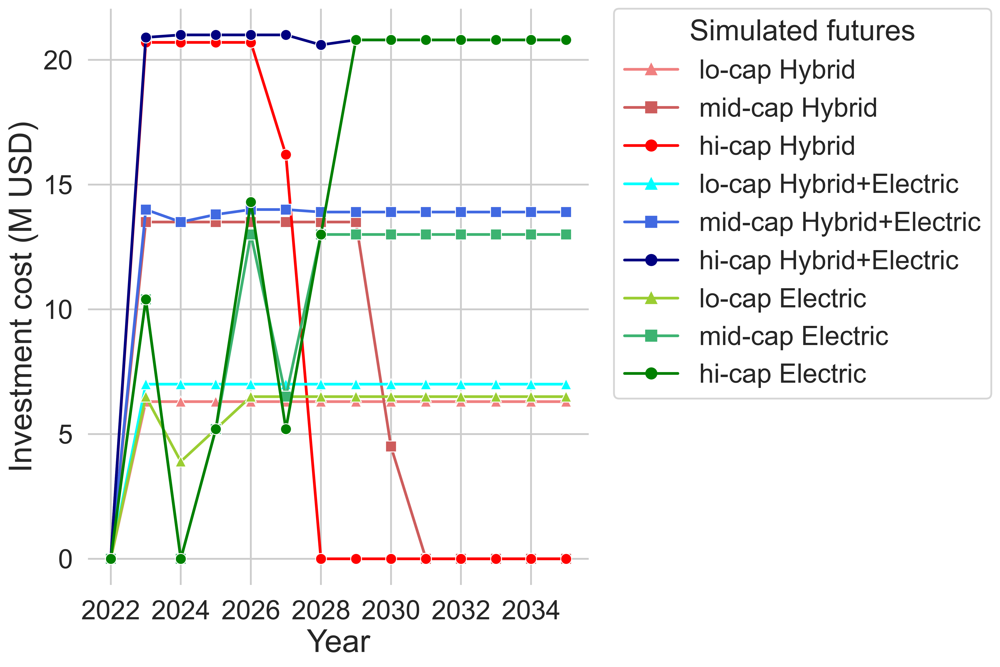

In [105]:
# Plotting with Seaborn
custom_palette = {
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid+Electric": "aqua",
    "mid-cap Hybrid+Electric": "royalblue",
    "hi-cap Hybrid+Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}

plt.figure(figsize=(12,8), dpi=400)
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger

# Set the hue_order based on custom_palette
sns.lineplot(data=grouped_df, x='Year', y='Investment Cost (M$)', hue='future',
             palette=custom_palette, markers=markers_order, dashes=False, style='future',
             hue_order=custom_palette.keys())  # This line forces the order

plt.xlabel('Year', fontsize=26)
plt.ylabel('Investment cost (M USD)', fontsize=26)

# Move the legend to the right outside of the plot
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=22, title_fontsize='24')

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.grid(True)
sns.despine(left=True, bottom=True)
plt.tight_layout()

# Save the figure before showing it
plt.savefig(r'../../figures/investment_cost_plot.png', bbox_inches='tight', dpi=400)  
plt.show()


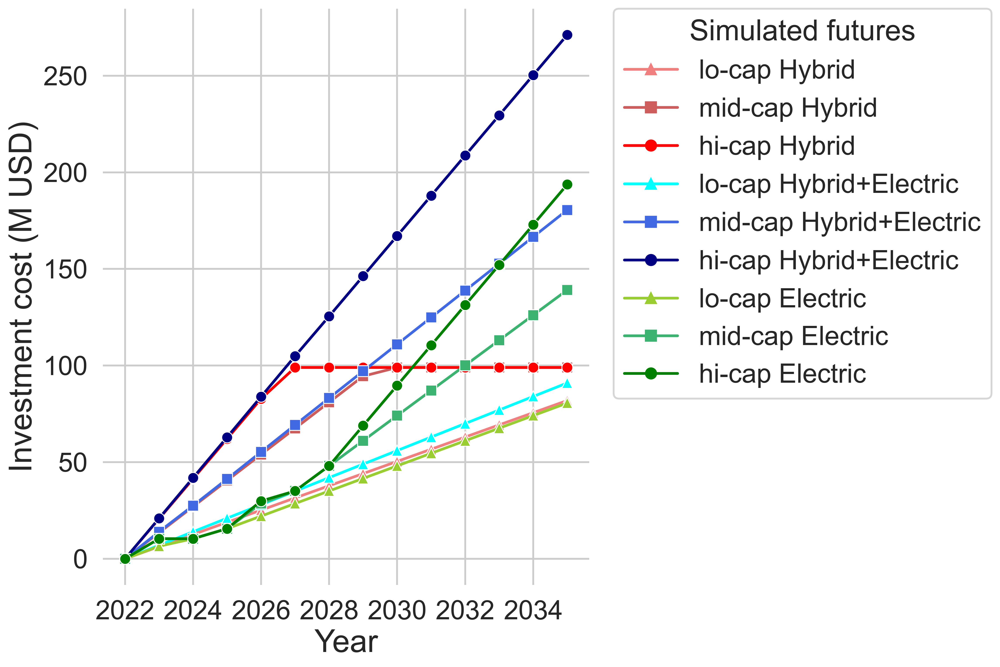

In [106]:
# Sorting by 'Year' and calculating the cumulative sum for each 'future' group
grouped_df['Cumulative Cost'] = grouped_df.sort_values(by='Year').groupby('future')['Investment Cost (M$)'].cumsum()

plt.figure(figsize=(12,8), dpi=400)
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger

# Adjust the sns.lineplot function to use 'Cumulative Cost' column
sns.lineplot(data=grouped_df, x='Year', y='Cumulative Cost', hue='future',
             palette=custom_palette, markers=markers_order, dashes=False, style='future',
             hue_order=custom_palette.keys())

plt.xlabel('Year', fontsize=26)
plt.ylabel('Investment cost (M USD)', fontsize=26)

# Move the legend to the right outside of the plot
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=22, title_fontsize='24')

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.grid(True)
sns.despine(left=True, bottom=True)
plt.tight_layout()

# Save the figure before showing it
plt.savefig(r'../../figures/investment_cost_plot.png', bbox_inches='tight', dpi=400)  
plt.show()

In [107]:
grouped_df

,Year,future,Investment Cost (M$),Cumulative Cost
0,2022,hi-cap Electric,0.0,0.0
1,2022,hi-cap Hybrid,0.0,0.0
2,2022,hi-cap Hybrid+Electric,0.0,0.0
3,2022,lo-cap Electric,0.0,0.0
4,2022,lo-cap Hybrid,0.0,0.0
...,...,...,...,...
121,2035,lo-cap Hybrid,6.3,81.9
122,2035,lo-cap Hybrid+Electric,7.0,91.0
123,2035,mid-cap Electric,13.0,139.1
124,2035,mid-cap Hybrid,0.0,99.0


In [108]:
pivot_df

Strategy,Hybrid,Hybrid+Electric,Electric
Scenario,,,
lo-cap,14.353959,22.428664,17.994106
mid-cap,18.142888,37.958893,26.290945
hi-cap,19.376049,44.530518,32.261544


In [109]:
pivot_df.to_pickle(r'../../results/pivot_df.pkl')

In [110]:
final_df

,Year,Result,Scenario,Strategy,Label,YearlyResult,CO2,YearlyResult10000gals,% Decrease
14,2022,2738.750000,h,FH,hi-cap Hybrid,707460.738888,7689.242204,70.746074,0.000000
15,2023,2535.826889,h,FH,hi-cap Hybrid,655042.616005,7119.520634,65.504262,7.409333
16,2024,2319.316865,h,FH,hi-cap Hybrid,599114.787048,6511.652806,59.911479,15.314765
17,2025,2151.389396,h,FH,hi-cap Hybrid,555736.570235,6040.184077,55.573657,21.446302
18,2026,2116.767773,h,FH,hi-cap Hybrid,546793.278956,5942.981322,54.679328,22.710442
...,...,...,...,...,...,...,...,...,...
135,2031,1869.475807,l,BM,lo-cap Hybrid Electric,482914.006665,5248.690926,48.291401,31.739815
136,2032,1775.253148,l,BM,lo-cap Hybrid Electric,458574.862181,4984.153876,45.857486,35.180168
137,2033,1682.534231,l,BM,lo-cap Hybrid Electric,434624.157104,4723.838692,43.462416,38.565615
138,2034,1591.483218,l,BM,lo-cap Hybrid Electric,411104.296973,4468.206272,41.110430,41.890161


In [111]:
final_df.to_csv(r'../../results/df_emissions_per_future.csv', index=False)